# Self-Driving Car Engineer Nanodegree


## Project: **Advanced Lane Finding on the Road** 
***
 [rubric points](https://review.udacity.com/#!/rubrics/571/view)


In [2]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import pickle
import cv2
import glob
import os
%matplotlib inline
path = os.getcwd()
print(path)

/Users/KrazyK/Documents/Udacity/CarND-Advanced-Lane-Lines


## Camera Calibration

List of images =  ['./camera_cal/calibration1.jpg', './camera_cal/calibration10.jpg', './camera_cal/calibration11.jpg', './camera_cal/calibration12.jpg', './camera_cal/calibration13.jpg', './camera_cal/calibration14.jpg', './camera_cal/calibration15.jpg', './camera_cal/calibration16.jpg', './camera_cal/calibration17.jpg', './camera_cal/calibration18.jpg', './camera_cal/calibration19.jpg', './camera_cal/calibration2.jpg', './camera_cal/calibration20.jpg', './camera_cal/calibration3.jpg', './camera_cal/calibration4.jpg', './camera_cal/calibration5.jpg', './camera_cal/calibration6.jpg', './camera_cal/calibration7.jpg', './camera_cal/calibration8.jpg', './camera_cal/calibration9.jpg']


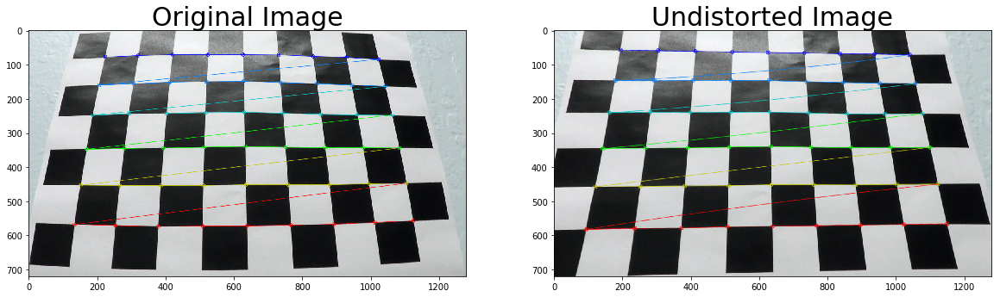

In [3]:
nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y

def calibrate(images, nx=9, ny=6):

    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((ny*nx,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Step through the list and search for chessboard corners
    for idx, fname in enumerate(images):
        img = cv2.imread(fname)
        # image size (x,y)
        img_size = (img.shape[1], img.shape[0])
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
            #write_name = './camera_cal/found/corners_found'+str(idx)+'.jpg'
            #cv2.imwrite(write_name, img)
    
    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist
    dist_pickle["rvecs"] = rvecs
    dist_pickle["tvecs"] = tvecs
#     pickle.dump( dist_pickle, open( "./camera_cal/dist_pickle.p", "wb" ) )
#     dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
    
    return ret, mtx, dist, rvecs, tvecs

# Make a list of calibration images
images= glob.glob('./camera_cal/calibration*.jpg')
print('List of images = ',images)

# Call calibration
ret, mtx, dist, rvecs, tvecs = calibrate(images, nx, ny)

#Test Undistort
img = cv2.imread(images[-7])
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# Find the chessboard corners
ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
cv2.drawChessboardCorners(img, (nx,ny), corners, ret)

# image size (x,y)
img_size = (img.shape[1], img.shape[0])

#Perform undistort
undist = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('./camera_cal/test_undist.jpg',undist)

# Visualize undistort
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=30)
plt.savefig("./camera_cal/Original+Undistort.png", transparent = False)


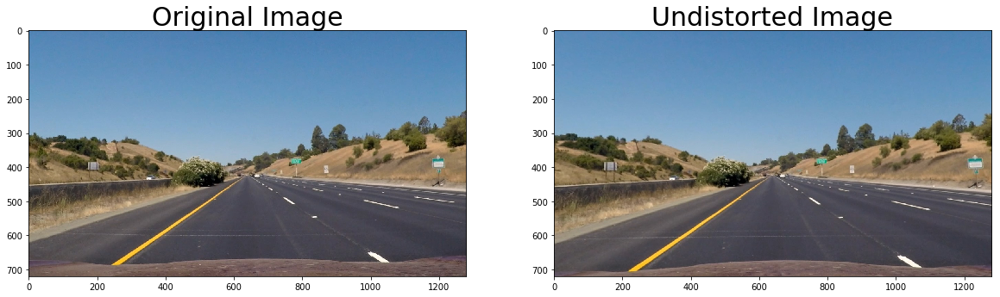

In [4]:
#Test Undistort on road images
testimg = cv2.imread('./test_images/straight_lines1.jpg')

# # image size (x,y)
# img_size = (img.shape[1], img.shape[0])

#Perform undistort
road_undist = cv2.undistort(testimg, mtx, dist, None, mtx)
cv2.imwrite('./test_images/test_undist_road.png', road_undist)

# Visualize undistort
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(cv2.cvtColor(testimg, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(cv2.cvtColor(road_undist, cv2.COLOR_BGR2RGB))
ax2.set_title('Undistorted Image', fontsize=30)
# plt.savefig("./test_images/Original+Undistort.png", transparent = True)


In [5]:
def warped(img, nx, ny, mtx, dist):
    
    img_size = (img.shape[1], img.shape[0])
    offset = 100
    # define 4 source points src = np.float32([[,],[,],[,],[,]])
    src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
#     print('Source Corners = ', src)
        
    # define 4 destination points dst = np.float32([[,],[,],[,],[,]])
    dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
    
    #  use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    #  use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped, M, Minv
print('warped function created')


warped function created


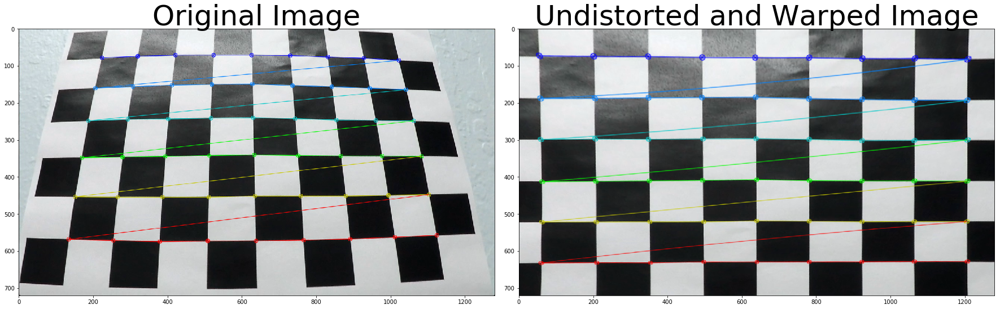

In [6]:
# Call warped function
warped, M, Minv = warped(undist, nx, ny, mtx, dist)

#Visualize original and warped
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(warped)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
# plt.savefig("./camera_cal/Original+Undistort+Warp.png", transparent = True)

## Color and Gradient Binary Masking

In [7]:
def color_gradient(img, s_thresh=(170,200), sx_thresh=(20,100), 
                   h_thresh=(20,22), l_thresh=(200, 255), r_thresh=(100,180), 
                   g_thresh=(100,180), dir_thresh=(0.7, 1.3), sobel_kernel=15, mag_thresh=(30, 100)):
    img = np.copy(img)
#     # Red channel
#     r_channel = img[:,:,0]
#     # Green channel
#     g_channel = img[:,:,1]
    
    # Convert to HLS color space and separate the L, S channels
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
    h_channel = hls[:,:,0]
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
#     # Convert to HSV color space and separate the L, S channels
#     hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
#     h_channel = hsv[:,:,0]
#     s_channel = hsv[:,:,1]
#     v_channel = hsv[:,:,2]
    
    # Sobel x and y
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0, ksize=sobel_kernel) # Take the derivative in x
#     sobely = cv2.Sobel(l_channel, cv2.CV_64F, 0, 1, ksize=sobel_kernel)# Take the derivative in y
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
#     abs_sobely = np.absolute(sobely) # Absolute x derivative to accentuate lines away from vertical
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Magnitude Threshold
    # Calculate the magnitude
#     mag_sobel = np.sqrt((np.square(sobelx) + np.square(sobely)))
#     # Scale to 8-bit (0 - 255) then convert to type = np.uint8
#     scaled_sobel = np.uint8(255*mag_sobel/np.max(mag_sobel))
    # Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
#     mag_binary = np.zeros_like(scaled_sobel)
#     mag_binary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    
#     # Threshold direction gradient
#     dir_sobel = np.arctan2(abs_sobely, abs_sobelx)
#     dir_binary = np.zeros_like(dir_sobel)
#     dir_binary[(dir_sobel >= dir_thresh[0]) & (dir_sobel <= dir_thresh[1])] = 1
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    # Threshold color s_channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    #Threshold color h_channel
    h_binary = np.zeros_like(h_channel)
    h_binary[(h_channel >= h_thresh[0]) & (h_channel <= h_thresh[1])] = 1
    #Threshold color l_channel
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    
#     # Sobel x and y
#     sobelx = cv2.Sobel(l_binary, cv2.CV_64F, 1, 0, ksize=sobel_kernel) # Take the derivative in x
#     sobely = cv2.Sobel(l_binary, cv2.CV_64F, 0, 1, ksize=sobel_kernel)# Take the derivative in y
#     abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
#     abs_sobely = np.absolute(sobely) # Absolute x derivative to accentuate lines away from vertical

#     # Threshold direction gradient
#     dir_sobel = np.arctan2(abs_sobely, abs_sobelx)
#     dir_binary = np.zeros_like(dir_sobel)
#     dir_binary[(dir_sobel >= dir_thresh[0]) & (dir_sobel <= dir_thresh[1])] = 1
    
    
#     # Threshold color r_channel
#     r_binary = np.zeros_like(r_channel)
#     r_binary[(r_channel >= r_thresh[0]) & (r_channel <= r_thresh[1])] = 1
#     # Threshold color g_channel
#     g_binary = np.zeros_like(g_channel)
#     g_binary[(g_channel >= g_thresh[0]) & (g_channel <= g_thresh[1])] = 1
    # Stack each channel
    color_binary = np.dstack(( h_binary ,sxbinary, s_binary))
    color_binary[l_binary[:,:] > 0] = 1

    # combine all binaries into 'white hot' image
    gray_binary = np.zeros_like(color_binary)
    gray_binary[color_binary[:,:,0] > 0] = 1
    gray_binary[color_binary[:,:,1] > 0] = 1
    gray_binary[color_binary[:,:,2] > 0] = 1 
    gray_binary[l_binary[:,:] > 0] = 1 
    
    return color_binary, gray_binary
    
color_grad, gray_grad = color_gradient(testimg)

print('color_gradient function created')

color_gradient function created


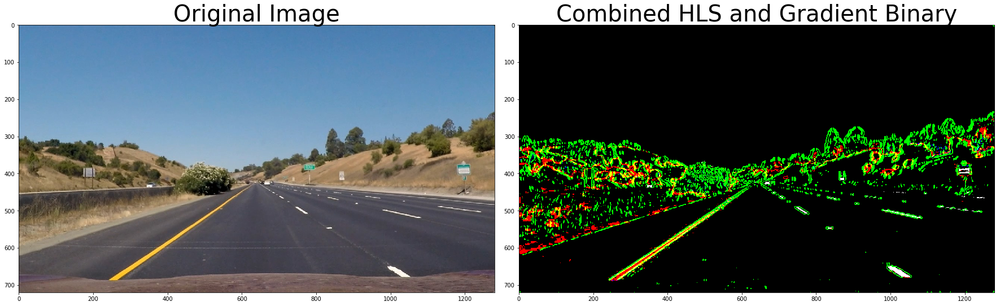

In [8]:
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(cv2.cvtColor(testimg, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(color_grad)
ax2.set_title('Combined HLS and Gradient Binary', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
# plt.savefig("./test_images/Color-Gradient-Binary.png", transparent = True)

## Perspective Transform

In [9]:
def lines_warp(img, inv=0, draw=None):
    imshape = color_grad.shape
    # White and yellow video Values
    lbxper = .14 # left bottom x vertice percentage
    rbxper = .89 # right bottom x vertice percentage
    byper = 1 # bottom y vertices percentage
    typer = .63 # top y vertices percentage
    lm = -0.453 # left slope 
    rm = 0.6 # right slope

    # Vertices calculations
    xlb = imshape[1]*lbxper
    ylb = imshape[0]*byper
    xlt = (imshape[0]*typer - ylb)/lm
    ylt = imshape[0]*typer
    xrb = imshape[1]*rbxper
    yrb = ylb
    xrt = (ylt - ylb)/rm + xrb
    yrt = ylt

    vertices = np.array([[(xlb,ylb),(xlt, ylt), (xrt, yrt), (xrb,yrb)]], dtype=np.int32)

    # Define polygon vertices for masking
    left_bottom = vertices[0][0]
    right_bottom = vertices[0][3]
    left_top = vertices[0][1]
    right_top = vertices[0][2]

    if draw:
        # Draw perspective lines on img
        cv2.line(img, (left_bottom[0], left_bottom[1]), (left_top[0], left_top[1]), (255,0,0), 1)
        cv2.line(img, (right_bottom[0], right_bottom[1]), (right_top[0], right_top[1]), (255,0,0), 1)
        cv2.line(img, (left_bottom[0], left_bottom[1]), (right_bottom[0], right_bottom[1]), (255,0,0), 1)
        cv2.line(img, (left_top[0], left_top[1]), (right_top[0], right_top[1]), (255,0,0), 1)


    # Perpective warp

    offset = 250
    # define 4 source points src = np.float32([[,],[,],[,],[,]])
    src = np.float32([[left_bottom[0], left_bottom[1]], [right_bottom[0], right_bottom[1]], 
                     [right_top[0], right_top[1]], [left_top[0], left_top[1]]])
#     print('Source Corners = ', src)

    # define 4 destination points dst = np.float32([[,],[,],[,],[,]])
    dst = np.float32([[offset, imshape[0]], [imshape[1]-offset, imshape[0]], 
                                     [imshape[1]-offset, 0], 
                                     [offset, 0]])
#     print('Destination Corners = ', dst)

    #  use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    if inv==0:
        #  use cv2.warpPerspective() to warp your image to a top-down view
        road_warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    if inv==1:
        #  use cv2.warpPerspective() to warp your image to a top-down view
        road_warped = cv2.warpPerspective(img, Minv, img_size, flags=cv2.INTER_LINEAR)
        
    return road_warped
print('lines_warp function created')


lines_warp function created


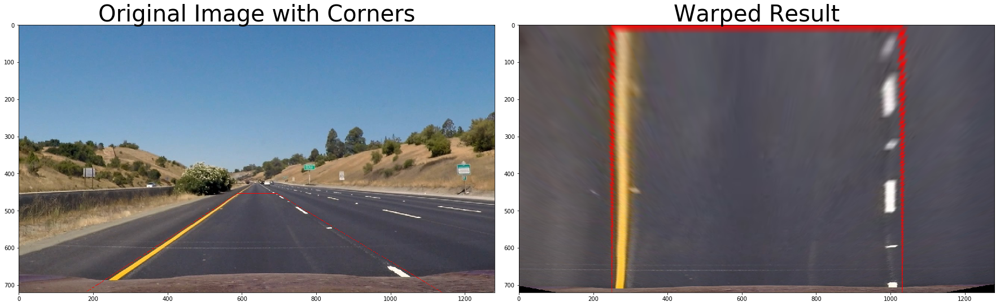

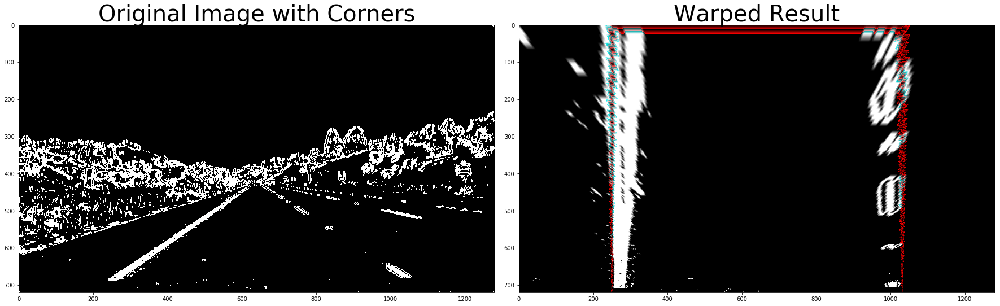

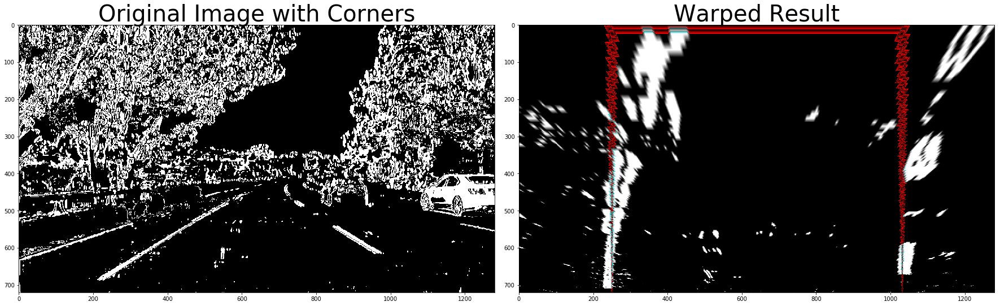

In [10]:
# Testing warped

testimg= np.copy(cv2.cvtColor(testimg, cv2.COLOR_BGR2RGB))
warped = lines_warp(testimg, draw=True)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(testimg)
ax1.set_title('Original Image with Corners', fontsize=40)

ax2.imshow(warped)
ax2.set_title('Warped Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
# plt.savefig("./test_images/Warped-Binary-Curved.png", transparent = False)

testimg = np.copy(gray_grad)
warped = lines_warp(testimg, draw=True)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(testimg)
ax1.set_title('Original Image with Corners', fontsize=40)

ax2.imshow(warped)
ax2.set_title('Warped Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
# plt.savefig("./test_images/Warped-Binary-Curved1.png", transparent = False)

testimg = cv2.imread('./test_images/test5.jpg')
color_grad, testimg = color_gradient(testimg)
warped = lines_warp(testimg, draw=True)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(testimg)
ax1.set_title('Original Image with Corners', fontsize=40)

ax2.imshow(warped)
ax2.set_title('Warped Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
# plt.savefig("./test_images/Warped-Binary-Curved2.png", transparent = False)

## Histogram

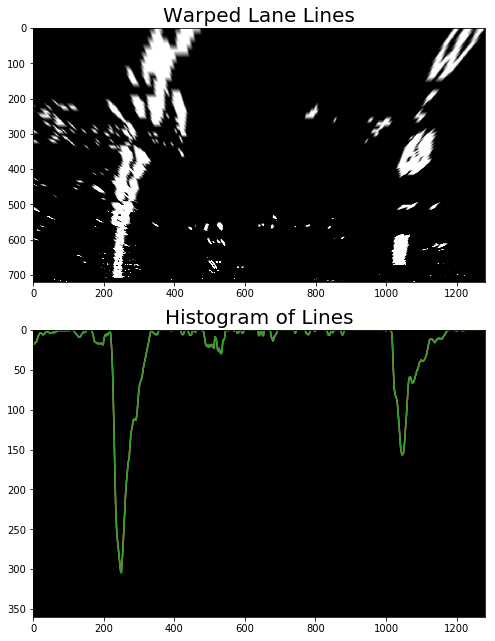

In [11]:
testimg = cv2.imread('./test_images/test5.jpg')
color_grad, testimg = color_gradient(testimg)
binary_warped = lines_warp(testimg)
# cv2.rectangle(img, (100,100), (600, 600), (255, 0, 0))

histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)

def plothist(warped, histogram):
    # Plot the result
    f, (ax1, ax2) = plt.subplots(2, 1, figsize=(7, 9))
    f.tight_layout()

    ax1.imshow(warped)
    ax1.set_title('Warped Lane Lines', fontsize=20)

    ax2.plot(histogram)
    ax2.set_title('Histogram of Lines', fontsize=20)
    ax2.set_facecolor('k')
    plt.xlim(0, img_size[0]); plt.ylim(img_size[1]//2, 0)
    # plt.savefig("./test_images/Warped-Histogram.png", transparent = False)

plothist(binary_warped, histogram)

# Finding the lines

## Sliding Window Practice

histogram shape (1280,)
out_img shape (720, 1280, 3)
leftx shape (137658,) first value 190
lefty shape (137658,) first value 640
rightx shape (77121,) first value 1016
righty shape (77121,) first value 640
left_fit shape (3,)
right_fit shape (3,)


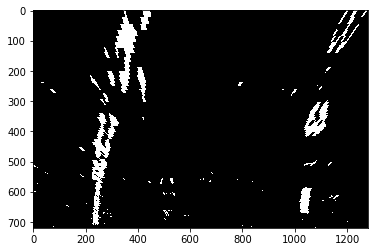

In [12]:

# Assuming you have created a warped binary image called "binary_warped"
# Take a histogram of the bottom half of the image
histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
# plt.plot(histogram)
# plt.axis('tight')
histogram = histogram[:,0]
print('histogram shape', histogram.shape)
# Create an output image to draw on and  visualize the result
# out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
out_img = np.copy(binary_warped).astype(np.uint8)*255 ;print('out_img shape',out_img.shape)
plt.imshow(out_img)
plt.axis('tight')
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2) #; print('midpoint',midpoint)
leftx_base = np.argmax(histogram[:midpoint]) #; print('leftx_base',leftx_base) ;print('leftx base value',histogram[leftx_base])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint #; print('rightx_base',rightx_base)
# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 75
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin#; print(win_xleft_low)
    win_xleft_high = leftx_current + margin#; print(win_xleft_high)
    win_xright_low = rightx_current - margin#; print(win_xright_low)
    win_xright_high = rightx_current + margin#; print(win_xright_high)
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0)) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0)) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds] ;print('leftx shape',leftx.shape, 'first value', leftx[0])
lefty = nonzeroy[left_lane_inds] ; print('lefty shape',lefty.shape, 'first value', lefty[0])
rightx = nonzerox[right_lane_inds] ;print('rightx shape',rightx.shape, 'first value', rightx[0])
righty = nonzeroy[right_lane_inds] ; print('righty shape',righty.shape, 'first value', righty[0])

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2) ;print('left_fit shape', left_fit.shape)
right_fit = np.polyfit(righty, rightx, 2) ;print('right_fit shape', right_fit.shape)


### Visualize the detected lines

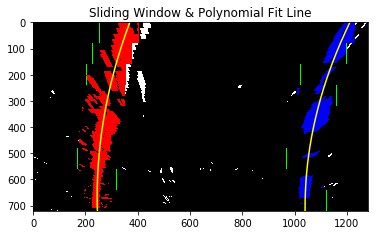

In [13]:
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.title('Sliding Window & Polynomial Fit Line')
# plt.savefig("./test_images/Sliding-Window-PolyFit.png", transparent = False)

## Skip sliding window once we know where lines are Practice

In [14]:
# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 75
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
print('ploty shape',ploty.shape, 'leftx shape',leftx.shape)


ploty shape (720,) leftx shape (156465,)


### Visualize the detected lines

out_img shape (720, 1280, 3)


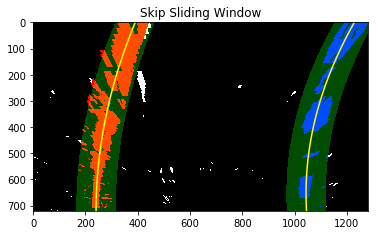

In [15]:
# Create an image to draw on and an image to show the selection window
# out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
out_img = np.copy(binary_warped).astype(np.uint8)*255 ;print('out_img shape',out_img.shape)
plt.imshow(out_img)
plt.axis('tight')
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.title('Skip Sliding Window')
# plt.savefig("./test_images/Skip-Sliding-Window-PolyFit.png", transparent = False)

## Radius of Curvature Practice

In [16]:
# Define y-value where we want radius of curvature
# I'll choose the maximum y-value, corresponding to the bottom of the image
y_eval = np.max(ploty)
left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
print(left_curverad, right_curverad)
# Example values: 1926.74 1908.48

1740.72214508 1167.71563444


### Radius of Curvature Realworld Practice

In [17]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 ; print('Meters per pixel in y = ', ym_per_pix)# meters per pixel in y dimension
xm_per_pix = 3.7/700 ; print('Meter per pixel in x = ', xm_per_pix)# meters per pixel in x dimension

print('ploty shape = ',ploty.shape, 'leftx shape = ',leftx.shape)
# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2) 
right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
# Calculate the new radii of curvature
left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
# Now our radius of curvature is in meters
print('Left radius of curvature = ', left_curverad, 'm', 'Right radius of curvature = ', right_curverad, 'm')

#Calculate centerline
print('y_eval = ', y_eval)
centerlinex = (right_fitx[int(y_eval)] - left_fitx[int(y_eval)])/2 + left_fitx[int(y_eval)] 
print('Lane Centerline at car hood = ',centerlinex)
caroffset = (1280/2 - centerlinex)*xm_per_pix
print('Car offset from centerline in meters = ',caroffset)


Meters per pixel in y =  0.041666666666666664
Meter per pixel in x =  0.005285714285714286
ploty shape =  (720,) leftx shape =  (156465,)
Left radius of curvature =  571.744338459 m Right radius of curvature =  381.82191377 m
y_eval =  719.0
Lane Centerline at car hood =  643.038682862
Car offset from centerline in meters =  -0.0160616094114


## Drawing the lane fill Practice

out_img shape (720, 1280, 3)


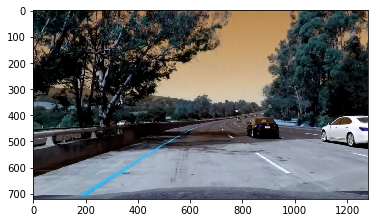

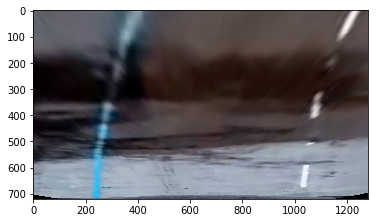

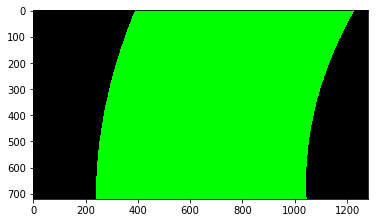

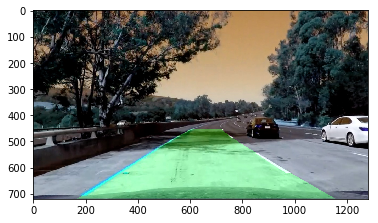

In [18]:
lanefill = cv2.imread('./test_images/test5.jpg')
#Perform undistort
lanefillundist = cv2.undistort(lanefill, mtx, dist, None, mtx)
plt.figure(3)
plt.imshow(lanefillundist)
plt.savefig("./test_images/Drawlane1.png", transparent = False)
# color_grad, testimg = color_gradient(testimg)
warped = lines_warp(lanefillundist)
plt.figure(4)
plt.imshow(warped)
plt.savefig("./test_images/Drawlane2.png", transparent = False)
# Create an image to draw the lines on
warp_zero = np.zeros_like(warped).astype(np.uint8)
# color_warp = np.dstack((warp_zero, warp_zero, warp_zero))*255
color_warp = np.copy(warp_zero).astype(np.uint8)*255 ;print('out_img shape',out_img.shape)

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
plt.figure(5)
plt.imshow(color_warp)
plt.savefig("./test_images/Drawlane3.png", transparent = False)

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = lines_warp(color_warp, 1)
# Combine the result with the original image
result = cv2.addWeighted(lanefillundist, 1, newwarp, 0.3, 0)
plt.figure(6)
plt.imshow(result)
plt.savefig("./test_images/Drawlane4.png", transparent = False)

## Mask out anything outside the lane

In [19]:
def masked(img):
    # Create copy of image for masking
    mask_image = np.copy(img)
    
    # Image sizes
    ysize = img.shape[0]
    xsize = img.shape[1]
    
    # White and yellow video Values
    lbxper = .07 # left bottom x vertice percentage
    rbxper = .93 # right bottom x vertice percentage
    byper = 1 # bottom y vertices percentage
    typer = .63 # top y vertices percentage
    lm = -0.46 # left slope 
    rm = 0.62 # right slope

    # Vertices calculations
    xlb = xsize*lbxper
    ylb = ysize*byper
    xlt = (ysize*typer - ylb)/lm
    ylt = ysize*typer
    xrb = xsize*rbxper
    yrb = ylb
    xrt = (ylt - ylb)/rm + xrb
    yrt = ylt
    vertices = np.array([[(xlb,ylb),(xlt, ylt), (xrt, yrt), (xrb,yrb)]], dtype=np.int32)

    # Define polygon vertices for masking
    left_bottom = vertices[0][0]
    right_bottom = vertices[0][3]
    left_top = vertices[0][1]
    right_top = vertices[0][2]

    
    fit_left = np.polyfit((left_bottom[0], left_top[0]), (left_bottom[1], left_top[1]), 1)
    fit_right = np.polyfit((right_bottom[0], right_top[0]), (right_bottom[1], right_top[1]), 1)
    fit_bottom = np.polyfit((left_bottom[0], right_bottom[0]), (left_bottom[1], right_bottom[1]), 1)
    fit_top = np.polyfit((left_top[0], right_top[0]), (left_top[1], right_top[1]), 1)
    
    # Find the region inside the lines
    XX, YY = np.meshgrid(np.arange(0, xsize), np.arange(0, ysize))
    region_thresholds = (YY > (XX*fit_left[0] + fit_left[1])) & \
                        (YY > (XX*fit_right[0] + fit_right[1])) & \
                        (YY < (XX*fit_bottom[0] + fit_bottom[1])) & \
                        (YY > (XX*fit_top[0] + fit_top[1]))
                    
    
    # Find where image is not in the region
    mask_image[~region_thresholds] = [0,0,0]
    
    return mask_image
print('masked function created')

masked function created


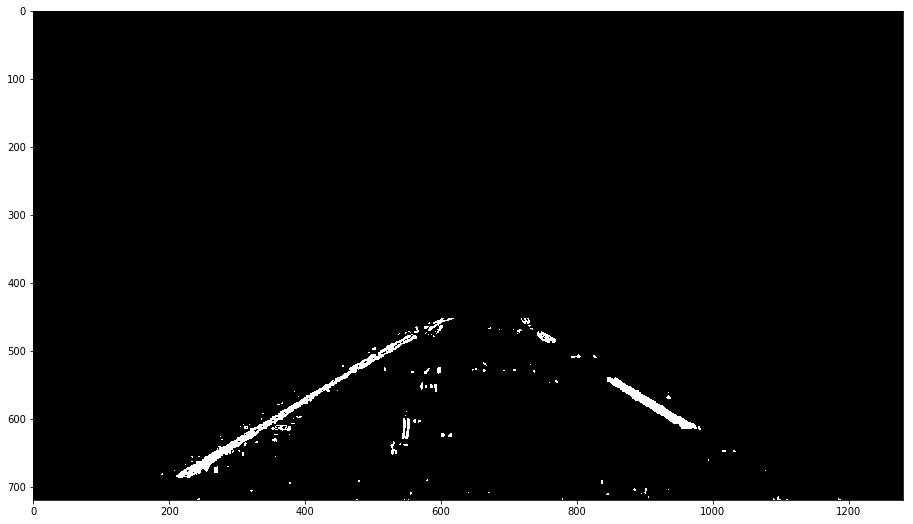

In [20]:
# Test masking
mask = masked(testimg)

plt.figure(6,figsize=(24,9))
plt.imshow(mask)

# plt.savefig("./test_images/masking.png", transparent = False)

## Create Line() class

In [21]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected fit
        self.fitx = None  
        #y values for detected fit
        self.fity = None
        
print('Line() class created')

Line() class created


In [22]:
def radius(ploty, fitx):    
    # Radius of curvature calcs
    y_eval = np.max(ploty)
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 #; print(ym_per_pix)# meters per pixel in y dimension
    xm_per_pix = 3.7/700 #; print(xm_per_pix)# meters per pixel in x dimension
    # Fit new polynomials to x,y in world space
    fit_cr = np.polyfit(ploty*ym_per_pix, fitx*xm_per_pix, 2) 
    # Calculate the new radii of curvature
    curverad  = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
    
    return fit_cr, curverad
print('radius function created')

radius function created


In [23]:
badfit=0
def sanity_check(lane, curverad, fitx, fit):
    global badfit
    if lane.current_fit==lane.bestx: # if the current fit is the same as the best fit
        badfit+=1 #increment bad fit counter
        if badfit>2: # if badfit count gets too high reset the Line classes for left and right
            leftLine = Line()
            rightLine = Line()
            badfit=0
#             leftLine.current_fit=[np.array([False])] 
#             rightLine.current_fit=[np.array([False])] 
#             leftLine.bestx=None
#             rightLine.bestx=None
#             leftLine.detected=False
#             rightLine.detected=False
    # Number of recent fits to keep
    n = 4
    # Sanity check for the lane
    if lane.detected: # If lane is detected
        
        # If sanity check passes
        if lane.radius_of_curvature: # If radius has been defined in the class
            if abs(curverad / lane.radius_of_curvature - 1) < .6: 
                
                if (len(lane.recent_xfitted) < n or lane.recent_xfitted==None): # if there are less than 4 recent fits or none
                    lane.recent_xfitted.append(fitx) #add the recent fit
                    lane.bestx = fitx # set the best fit to the current fit since we don't have enough yet to calculate the average
                else:
                    del lane.recent_xfitted[0] # delete the oldest fit from recent fits
                    lane.recent_xfitted.append(fitx) #append the most recent fit 
                    # find the average of the most recent 4 fits
                    bestx = (lane.recent_xfitted[0] + lane.recent_xfitted[1]+ lane.recent_xfitted[2]+ lane.recent_xfitted[3])/n
                    lane.bestx = bestx # assign this average to the Line() class.
                # set Line() as detected and add the most recent parameters
                lane.detected = True 
                lane.current_fit = fit 
                lane.fitx = fitx           
                lane.radius_of_curvature = curverad
                lane.current_fit = fit
            # If sanity check fails use the previous averaged values
            else: 
                lane.detected = False
                fitx = lane.bestx
                print('sanity failed')
        else: # If radius is not defined in Line() class assign it
            lane.radius_of_curvature = curverad
            lane.detected = True
    else: # if lane not detected
        if lane.radius_of_curvature: # if radius is defined
            if abs(curverad / lane.radius_of_curvature - 1) < .6: # check the ratio of the new radius value to the previous
                if (len(lane.recent_xfitted) < n or lane.recent_xfitted==None):
                    lane.recent_xfitted.append(fitx)
                    lane.bestx = fitx 
                else:
                    del lane.recent_xfitted[0] 
                    lane.recent_xfitted.append(fitx) 
                    bestx = (lane.recent_xfitted[0] + lane.recent_xfitted[1] + lane.recent_xfitted[2]+ lane.recent_xfitted[3])/n
                    lane.bestx = bestx 
                    
                lane.detected = True
                lane.current_fit = fit
                lane.fitx = fitx          
                lane.radius_of_curvature = curverad
            else: # if ratio is out of spec reuse the previous best average
                lane.detected = False
                fitx = lane.bestx 
                print('sanity failed')
        
        else:# If curvature was not defined try to perform averaging of fit
            if (len(lane.recent_xfitted) < n or lane.recent_xfitted==None):
                    lane.recent_xfitted.append(fitx)
                    lane.bestx = fitx 
            else:
                del lane.recent_xfitted[0] 
                lane.recent_xfitted.append(fitx) 
                bestx = (lane.recent_xfitted[0] + lane.recent_xfitted[1] + lane.recent_xfitted[2]+ lane.recent_xfitted[3])/n
                lane.bestx = bestx
            # populate fit, radius, and detection data if this was the first iteration to prevent error
            lane.detected = True
            lane.current_fit = fit
            lane.fitx = fitx
            lane.radius_of_curvature = curverad
    
    return fitx
print('sanity_check function created')

sanity_check function created


In [24]:
# Function to find lane lines using the binary warped image
def find_lane(binary_warped):
    #initialize fit arrays
    left_fitx = np.zeros((720,)) 
    right_fitx = np.zeros((720,))
    left_fit = []
    right_fit = []
    
    # If line not previously detected run sliding window search using the histogram for starting point
    if not (leftLine.detected or rightLine.detected):
        print('Sliding Window Search...')
        # Assuming you have created a warped binary image called "binary_warped"
        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
        # plt.plot(histogram)
        # plt.axis('tight')
        histogram = histogram[:,0] # down sample histogram to work with peak finding
        #print('histogram shape', histogram.shape)
        
        # Create an output image to draw on and  visualize the result
        # out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        out_img = np.copy(binary_warped).astype(np.uint8)*255 #;print('out_img shape',out_img.shape)

        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2) #; print('midpoint',midpoint)
        leftx_base = np.argmax(histogram[:midpoint]) #; print('leftx_base',leftx_base) ;print('leftx base value',histogram[leftx_base])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint #; print('rightx_base',rightx_base)
        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
        # Set the width of the windows +/- margin
        margin = 75
        # Set minimum number of pixels found to recenter window
        minpix = 50
        
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin#; print(win_xleft_low)
            win_xleft_high = leftx_current + margin#; print(win_xleft_high)
            win_xright_low = rightx_current - margin#; print(win_xright_low)
            win_xright_high = rightx_current + margin#; print(win_xright_high)
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0)) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0)) 
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds]
        
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]

        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        # update Line() class with latest values
        leftLine.current_fit = left_fit
        rightLine.current_fit = right_fit
        
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2] #; print('left_fitx', left_fitx.shape,type(left_fitx))
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    else:
        print('Previous Fit Search...')
        left_fit = leftLine.current_fit #;print(len(left_fit))
        right_fit = rightLine.current_fit #;print(len(right_fit))
        #Assumes you already have detected the lane and now will be searching along that lane instead of blindly
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        margin = 75
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

        # Again, extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds]
        
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        
        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        # update Line() class with latest values
        leftLine.current_fit = left_fit
        rightLine.current_fit = right_fit
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2] #;print('right_fitx in non sliding',right_fitx.shape)
        
    return left_fit, right_fit, left_fitx, right_fitx, ploty
print('find_lane function created')

find_lane function created


In [25]:
# pipline for detecting lane line from video images
def process_image(img):
    global i, K, left_fitx, right_fitx, left_fit, right_fit, leftLine, rightLine
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    
    # image size (x,y)
    img_size = (img.shape[1], img.shape[0])

    #Perform undistort
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    #Color and gradient thresholding
    color_binary, gray_binary = color_gradient(undist)
    
    #Mask out everything but lane
    mask = masked(gray_binary)
    
    #Perspective transform
    binary_warped = lines_warp(mask)
    
    # Find lane
    left_fit, right_fit, left_fitx, right_fitx, ploty = find_lane(binary_warped)
    #print(left_fit.shape, right_fit.shape, left_fitx.shape, right_fitx.shape, ploty.shape)
    # Radius of curvature calcs
    left_fit_cr, left_curverad = radius(ploty, left_fitx)
    right_fit_cr, right_curverad = radius(ploty, right_fitx)
    
    #Sanity checks
    left_fitx = sanity_check(leftLine, left_curverad, left_fitx, left_fit)
    right_fitx = sanity_check(rightLine, right_curverad, right_fitx, right_fit) 
    
    #Calculate centerline
    centerlinex = (right_fitx[int(y_eval)] - left_fitx[int(y_eval)])/2 + left_fitx[int(y_eval)] 
    caroffset = (1280/2 - centerlinex)*xm_per_pix
    
    # Write text for parameters of interest
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(undist,('left radius of curvature = ' + repr(left_curverad) + ' m'),(20,50), font, .75,(0,255,0),2,cv2.LINE_AA)
    cv2.putText(undist,('right radius of curvature = ' + repr(right_curverad) + ' m'),(20,70), font, .75,(0,255,0),2,cv2.LINE_AA)
    cv2.putText(undist,('Car offset from center = ' + repr(caroffset) + ' m'),(20,90), font, .75,(0,255,0),2,cv2.LINE_AA)
    cv2.putText(undist,('Center of Car'),(1280//2-100,720-30), font, .75,(0,0,255),2,cv2.LINE_AA)
  
    #Highlight lane and Perform undistort
    warped = lines_warp(undist)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    # color_warp = np.dstack((warp_zero, warp_zero, warp_zero))*255
    color_warp = np.copy(warp_zero).astype(np.uint8)*255 #;print('out_img shape',out_img.shape)

    #print('bestx shape', leftLine.bestx.shape, 'ploty shape', ploty.shape)
    pts_left = np.array([np.transpose(np.vstack([leftLine.bestx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([rightLine.bestx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Centerline Recast the x and y points into usable format for cv2.fillPoly()
    lw = 5
    centerx = (rightLine.bestx - leftLine.bestx)/2 + leftLine.bestx 
    cpts_left = np.array([np.transpose(np.vstack([centerx-lw, ploty]))])
    cpts_right = np.array([np.flipud(np.transpose(np.vstack([centerx+lw, ploty])))])
    cpts = np.hstack((cpts_left, cpts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.fillPoly(color_warp, np.int_([cpts]), (255,0,0))
    rect = np.array([ [1280/2-5,720], [1280/2+5,720], [1280/2+5,720-20], [1280/2-5,720-20] ], np.int32) 

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = lines_warp(color_warp, inv=1)
    
    # Combine the result with the original image
#     undist = np.copy(mask).astype(np.uint8)*255
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    cv2.fillPoly(result, [rect], (0,0,255))
    
    return result
print('process_image function created')

process_image function created


In [26]:
leftLine = Line()
rightLine = Line()

Sliding Window Search...


/Users/KrazyK/Documents/Udacity/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:4: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.


Previous Fit Search...
sanity failed


/Users/KrazyK/Documents/Udacity/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:4: DeprecationWarning: elementwise == comparison failed; this will raise an error in the future.


Previous Fit Search...
sanity failed
Previous Fit Search...
sanity failed
Previous Fit Search...
sanity failed
Previous Fit Search...
sanity failed
sanity failed


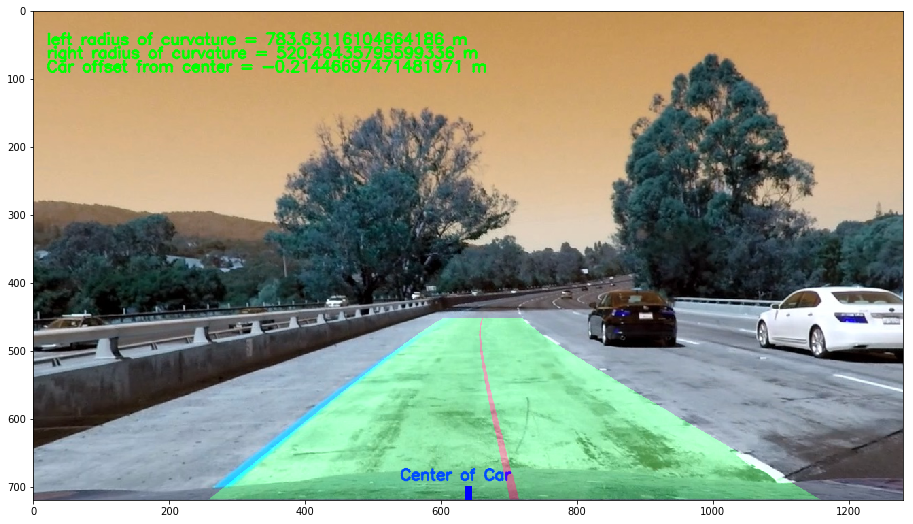

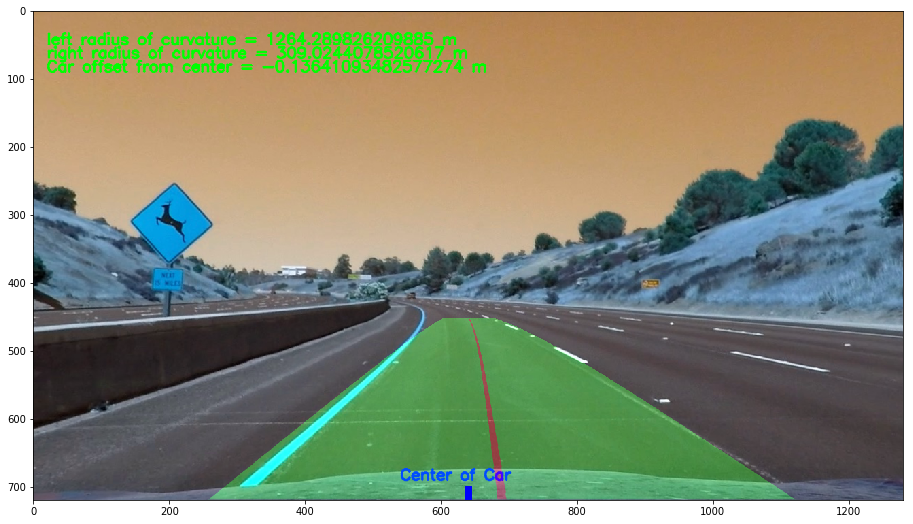

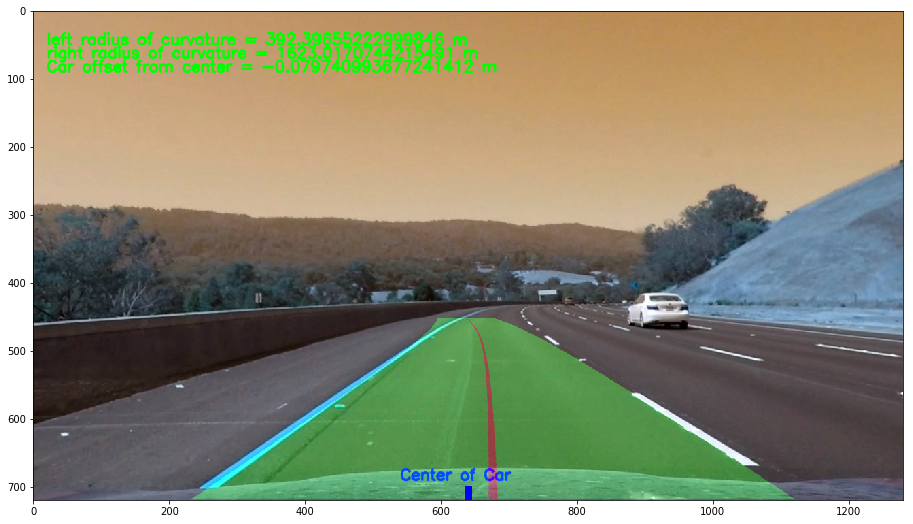

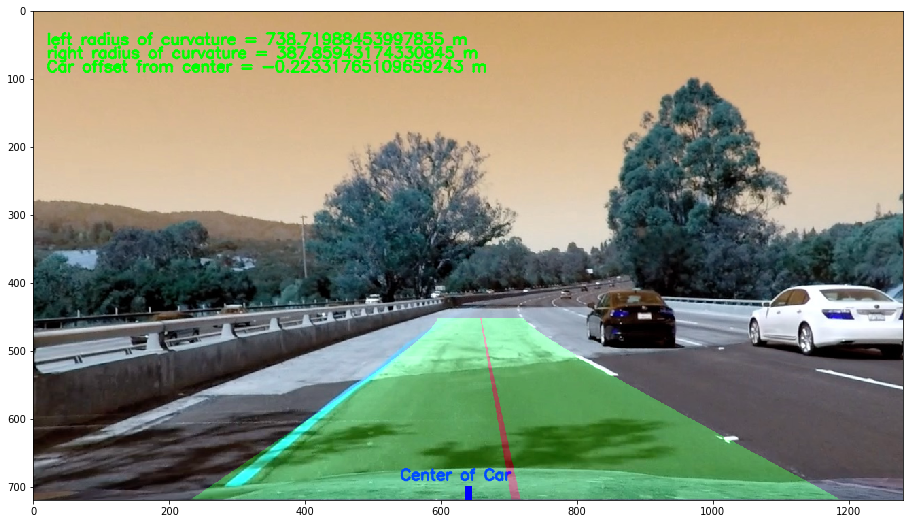

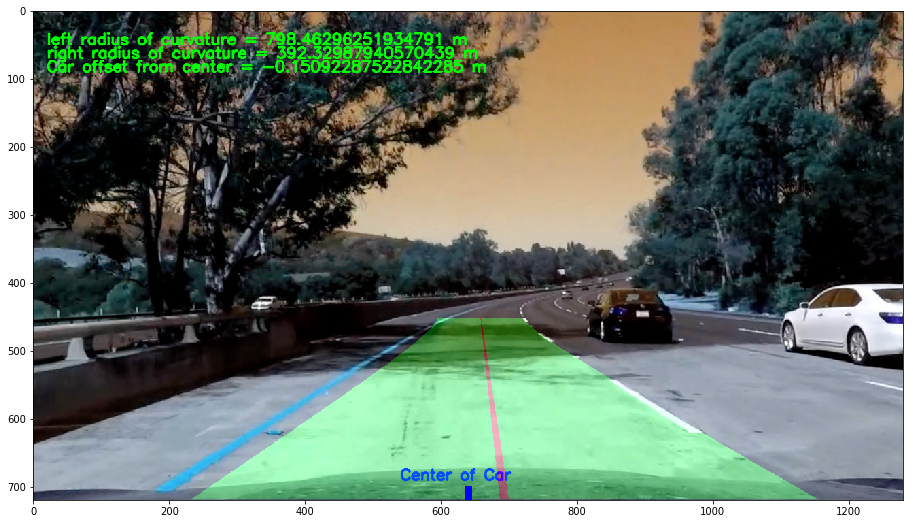

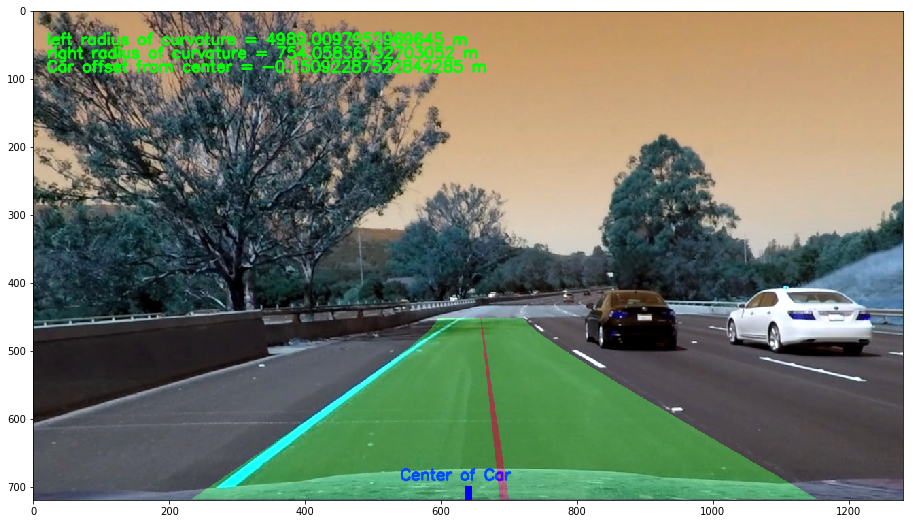

In [27]:
for i, img in enumerate(glob.glob('./test_images/test*.jpg')):
    test = cv2.imread(img)
    result = process_image(test)
    plt.figure(i,figsize=(24,9))
    plt.imshow(result)

In [28]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [29]:
# Run pipeline on video
leftLine = Line()
rightLine = Line()
project_output = 'project_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
project_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time project_clip.write_videofile(project_output, audio=False)

Sliding Window Search...
[MoviePy] >>>> Building video project_output.mp4
[MoviePy] Writing video project_output.mp4


  0%|          | 1/1261 [00:00<06:33,  3.21it/s]

Previous Fit Search...


  0%|          | 2/1261 [00:00<06:32,  3.20it/s]

Previous Fit Search...


  0%|          | 3/1261 [00:00<06:27,  3.25it/s]

Previous Fit Search...


  0%|          | 4/1261 [00:01<06:22,  3.29it/s]

Previous Fit Search...


  0%|          | 5/1261 [00:01<06:17,  3.33it/s]

Previous Fit Search...


  0%|          | 6/1261 [00:01<06:11,  3.38it/s]

Previous Fit Search...


  1%|          | 7/1261 [00:02<06:04,  3.44it/s]

Previous Fit Search...


  1%|          | 8/1261 [00:02<06:01,  3.47it/s]

Previous Fit Search...


  1%|          | 9/1261 [00:02<05:57,  3.50it/s]

Previous Fit Search...


  1%|          | 10/1261 [00:02<05:56,  3.51it/s]

Previous Fit Search...


  1%|          | 11/1261 [00:03<05:56,  3.50it/s]

Previous Fit Search...


  1%|          | 12/1261 [00:03<05:55,  3.52it/s]

Previous Fit Search...


  1%|          | 13/1261 [00:03<05:55,  3.51it/s]

Previous Fit Search...
sanity failed


  1%|          | 14/1261 [00:04<06:05,  3.41it/s]

Previous Fit Search...


  1%|          | 15/1261 [00:04<06:05,  3.41it/s]

Previous Fit Search...
sanity failed


  1%|▏         | 16/1261 [00:04<06:05,  3.41it/s]

Previous Fit Search...
sanity failed


  1%|▏         | 17/1261 [00:04<06:02,  3.43it/s]

Previous Fit Search...


  1%|▏         | 18/1261 [00:05<06:00,  3.45it/s]

Previous Fit Search...


  2%|▏         | 19/1261 [00:05<06:00,  3.45it/s]

Previous Fit Search...


  2%|▏         | 20/1261 [00:05<05:56,  3.48it/s]

Previous Fit Search...


  2%|▏         | 21/1261 [00:06<05:55,  3.49it/s]

Previous Fit Search...
sanity failed


  2%|▏         | 22/1261 [00:06<05:56,  3.47it/s]

Previous Fit Search...
sanity failed


  2%|▏         | 23/1261 [00:06<05:54,  3.49it/s]

Previous Fit Search...
sanity failed


  2%|▏         | 24/1261 [00:06<05:52,  3.51it/s]

Previous Fit Search...


  2%|▏         | 25/1261 [00:07<05:53,  3.50it/s]

Previous Fit Search...


  2%|▏         | 26/1261 [00:07<05:51,  3.52it/s]

Previous Fit Search...


  2%|▏         | 27/1261 [00:07<05:49,  3.53it/s]

Previous Fit Search...


  2%|▏         | 28/1261 [00:08<05:46,  3.55it/s]

Previous Fit Search...


  2%|▏         | 29/1261 [00:08<05:50,  3.52it/s]

Previous Fit Search...


  2%|▏         | 30/1261 [00:08<05:46,  3.55it/s]

Previous Fit Search...
sanity failed


  2%|▏         | 31/1261 [00:08<05:45,  3.56it/s]

Previous Fit Search...


  3%|▎         | 32/1261 [00:09<05:43,  3.57it/s]

Previous Fit Search...


  3%|▎         | 33/1261 [00:09<05:45,  3.55it/s]

Previous Fit Search...


  3%|▎         | 34/1261 [00:09<05:47,  3.54it/s]

Previous Fit Search...


  3%|▎         | 35/1261 [00:10<05:44,  3.56it/s]

Previous Fit Search...


  3%|▎         | 36/1261 [00:10<05:42,  3.58it/s]

Previous Fit Search...


  3%|▎         | 37/1261 [00:10<05:43,  3.56it/s]

Previous Fit Search...


  3%|▎         | 38/1261 [00:10<05:43,  3.56it/s]

Previous Fit Search...


  3%|▎         | 39/1261 [00:11<05:45,  3.54it/s]

Previous Fit Search...


  3%|▎         | 40/1261 [00:11<05:43,  3.55it/s]

Previous Fit Search...


  3%|▎         | 41/1261 [00:11<05:43,  3.55it/s]

Previous Fit Search...


  3%|▎         | 42/1261 [00:12<05:40,  3.58it/s]

Previous Fit Search...


  3%|▎         | 43/1261 [00:12<05:43,  3.54it/s]

Previous Fit Search...


  3%|▎         | 44/1261 [00:12<05:43,  3.55it/s]

Previous Fit Search...


  4%|▎         | 45/1261 [00:12<05:39,  3.58it/s]

Previous Fit Search...


  4%|▎         | 46/1261 [00:13<05:41,  3.56it/s]

Previous Fit Search...


  4%|▎         | 47/1261 [00:13<05:40,  3.56it/s]

Previous Fit Search...


  4%|▍         | 48/1261 [00:13<05:43,  3.53it/s]

Previous Fit Search...


  4%|▍         | 49/1261 [00:13<05:41,  3.55it/s]

Previous Fit Search...


  4%|▍         | 50/1261 [00:14<05:42,  3.54it/s]

Previous Fit Search...


  4%|▍         | 51/1261 [00:14<05:42,  3.53it/s]

Previous Fit Search...


  4%|▍         | 52/1261 [00:14<05:47,  3.48it/s]

Previous Fit Search...


  4%|▍         | 53/1261 [00:15<05:51,  3.44it/s]

Previous Fit Search...


  4%|▍         | 54/1261 [00:15<05:53,  3.42it/s]

Previous Fit Search...


  4%|▍         | 55/1261 [00:15<05:51,  3.43it/s]

Previous Fit Search...


  4%|▍         | 56/1261 [00:16<05:46,  3.48it/s]

Previous Fit Search...
sanity failed


  5%|▍         | 57/1261 [00:16<05:46,  3.47it/s]

Previous Fit Search...
sanity failed


  5%|▍         | 58/1261 [00:16<05:56,  3.37it/s]

Previous Fit Search...
sanity failed


  5%|▍         | 59/1261 [00:16<05:58,  3.36it/s]

Previous Fit Search...


  5%|▍         | 60/1261 [00:17<05:57,  3.36it/s]

Previous Fit Search...


  5%|▍         | 61/1261 [00:17<06:06,  3.28it/s]

Previous Fit Search...


  5%|▍         | 62/1261 [00:17<06:12,  3.22it/s]

Previous Fit Search...
sanity failed


  5%|▍         | 63/1261 [00:18<06:11,  3.23it/s]

Previous Fit Search...


  5%|▌         | 64/1261 [00:18<06:13,  3.20it/s]

Previous Fit Search...


  5%|▌         | 65/1261 [00:18<06:15,  3.19it/s]

Previous Fit Search...


  5%|▌         | 66/1261 [00:19<06:13,  3.20it/s]

Previous Fit Search...


  5%|▌         | 67/1261 [00:19<06:06,  3.26it/s]

Previous Fit Search...


  5%|▌         | 68/1261 [00:19<06:11,  3.21it/s]

Previous Fit Search...


  5%|▌         | 69/1261 [00:20<06:10,  3.22it/s]

Previous Fit Search...


  6%|▌         | 70/1261 [00:20<06:05,  3.26it/s]

Previous Fit Search...


  6%|▌         | 71/1261 [00:20<05:55,  3.34it/s]

Previous Fit Search...


  6%|▌         | 72/1261 [00:20<05:47,  3.42it/s]

Previous Fit Search...


  6%|▌         | 73/1261 [00:21<05:53,  3.36it/s]

Previous Fit Search...
sanity failed


  6%|▌         | 74/1261 [00:21<05:57,  3.32it/s]

Previous Fit Search...
sanity failed


  6%|▌         | 75/1261 [00:21<05:59,  3.30it/s]

Previous Fit Search...
sanity failed


  6%|▌         | 76/1261 [00:22<05:58,  3.31it/s]

Previous Fit Search...
sanity failed


  6%|▌         | 77/1261 [00:22<06:01,  3.28it/s]

Previous Fit Search...
sanity failed


  6%|▌         | 78/1261 [00:22<05:53,  3.34it/s]

Previous Fit Search...


  6%|▋         | 79/1261 [00:23<05:47,  3.40it/s]

Previous Fit Search...


  6%|▋         | 80/1261 [00:23<05:49,  3.38it/s]

Previous Fit Search...
sanity failed


  6%|▋         | 81/1261 [00:23<05:51,  3.36it/s]

Previous Fit Search...
sanity failed


  7%|▋         | 82/1261 [00:23<05:46,  3.41it/s]

Previous Fit Search...
sanity failed


  7%|▋         | 83/1261 [00:24<05:49,  3.37it/s]

Previous Fit Search...
sanity failed


  7%|▋         | 84/1261 [00:24<05:50,  3.36it/s]

Previous Fit Search...
sanity failed


  7%|▋         | 85/1261 [00:24<05:45,  3.41it/s]

Previous Fit Search...


  7%|▋         | 86/1261 [00:25<05:35,  3.50it/s]

Previous Fit Search...


  7%|▋         | 87/1261 [00:25<05:35,  3.50it/s]

Previous Fit Search...


  7%|▋         | 88/1261 [00:25<05:37,  3.47it/s]

Previous Fit Search...


  7%|▋         | 89/1261 [00:25<05:37,  3.47it/s]

Previous Fit Search...


  7%|▋         | 90/1261 [00:26<05:35,  3.50it/s]

Previous Fit Search...


  7%|▋         | 91/1261 [00:26<05:33,  3.51it/s]

Previous Fit Search...


  7%|▋         | 92/1261 [00:26<05:32,  3.51it/s]

Previous Fit Search...


  7%|▋         | 93/1261 [00:27<05:31,  3.52it/s]

Previous Fit Search...


  7%|▋         | 94/1261 [00:27<05:32,  3.51it/s]

Previous Fit Search...


  8%|▊         | 95/1261 [00:27<05:31,  3.51it/s]

Previous Fit Search...


  8%|▊         | 96/1261 [00:27<05:29,  3.54it/s]

Previous Fit Search...


  8%|▊         | 97/1261 [00:28<05:30,  3.52it/s]

Previous Fit Search...


  8%|▊         | 98/1261 [00:28<05:30,  3.52it/s]

Previous Fit Search...


  8%|▊         | 99/1261 [00:28<05:30,  3.52it/s]

Previous Fit Search...


  8%|▊         | 100/1261 [00:29<05:39,  3.42it/s]

Previous Fit Search...


  8%|▊         | 101/1261 [00:29<05:45,  3.36it/s]

Previous Fit Search...


  8%|▊         | 102/1261 [00:29<05:49,  3.32it/s]

Previous Fit Search...


  8%|▊         | 103/1261 [00:30<05:52,  3.29it/s]

Previous Fit Search...


  8%|▊         | 104/1261 [00:30<05:52,  3.28it/s]

Previous Fit Search...


  8%|▊         | 105/1261 [00:30<05:44,  3.35it/s]

Previous Fit Search...


  8%|▊         | 106/1261 [00:30<05:39,  3.40it/s]

Previous Fit Search...


  8%|▊         | 107/1261 [00:31<05:44,  3.35it/s]

Previous Fit Search...


  9%|▊         | 108/1261 [00:31<05:47,  3.32it/s]

Previous Fit Search...


  9%|▊         | 109/1261 [00:31<05:48,  3.30it/s]

Previous Fit Search...


  9%|▊         | 110/1261 [00:32<05:49,  3.30it/s]

Previous Fit Search...


  9%|▉         | 111/1261 [00:32<05:49,  3.29it/s]

Previous Fit Search...


  9%|▉         | 112/1261 [00:32<05:48,  3.30it/s]

Previous Fit Search...


  9%|▉         | 113/1261 [00:32<05:37,  3.40it/s]

Previous Fit Search...


  9%|▉         | 114/1261 [00:33<05:32,  3.45it/s]

Previous Fit Search...


  9%|▉         | 115/1261 [00:33<05:30,  3.46it/s]

Previous Fit Search...


  9%|▉         | 116/1261 [00:33<05:29,  3.48it/s]

Previous Fit Search...


  9%|▉         | 117/1261 [00:34<05:28,  3.48it/s]

Previous Fit Search...


  9%|▉         | 118/1261 [00:34<05:27,  3.49it/s]

Previous Fit Search...


  9%|▉         | 119/1261 [00:34<05:24,  3.51it/s]

Previous Fit Search...


 10%|▉         | 120/1261 [00:34<05:23,  3.53it/s]

Previous Fit Search...


 10%|▉         | 121/1261 [00:35<05:24,  3.51it/s]

Previous Fit Search...


 10%|▉         | 122/1261 [00:35<05:23,  3.52it/s]

Previous Fit Search...


 10%|▉         | 123/1261 [00:35<05:20,  3.55it/s]

Previous Fit Search...


 10%|▉         | 124/1261 [00:36<05:19,  3.56it/s]

Previous Fit Search...


 10%|▉         | 125/1261 [00:36<05:19,  3.56it/s]

Previous Fit Search...


 10%|▉         | 126/1261 [00:36<05:33,  3.40it/s]

Previous Fit Search...


 10%|█         | 127/1261 [00:36<05:36,  3.37it/s]

Previous Fit Search...


 10%|█         | 128/1261 [00:37<05:36,  3.37it/s]

Previous Fit Search...


 10%|█         | 129/1261 [00:37<05:36,  3.37it/s]

Previous Fit Search...


 10%|█         | 130/1261 [00:37<05:38,  3.34it/s]

Previous Fit Search...


 10%|█         | 131/1261 [00:38<05:35,  3.36it/s]

Previous Fit Search...


 10%|█         | 132/1261 [00:38<05:30,  3.41it/s]

Previous Fit Search...


 11%|█         | 133/1261 [00:38<05:23,  3.49it/s]

Previous Fit Search...


 11%|█         | 134/1261 [00:39<05:23,  3.48it/s]

Previous Fit Search...


 11%|█         | 135/1261 [00:39<05:30,  3.41it/s]

Previous Fit Search...


 11%|█         | 136/1261 [00:39<05:36,  3.34it/s]

Previous Fit Search...


 11%|█         | 137/1261 [00:39<05:39,  3.31it/s]

Previous Fit Search...


 11%|█         | 138/1261 [00:40<05:39,  3.31it/s]

Previous Fit Search...


 11%|█         | 139/1261 [00:40<05:38,  3.32it/s]

Previous Fit Search...


 11%|█         | 140/1261 [00:40<05:39,  3.31it/s]

Previous Fit Search...


 11%|█         | 141/1261 [00:41<05:37,  3.31it/s]

Previous Fit Search...


 11%|█▏        | 142/1261 [00:41<05:29,  3.39it/s]

Previous Fit Search...


 11%|█▏        | 143/1261 [00:41<05:23,  3.46it/s]

Previous Fit Search...


 11%|█▏        | 144/1261 [00:42<05:19,  3.49it/s]

Previous Fit Search...


 11%|█▏        | 145/1261 [00:42<05:16,  3.52it/s]

Previous Fit Search...


 12%|█▏        | 146/1261 [00:42<05:14,  3.54it/s]

Previous Fit Search...


 12%|█▏        | 147/1261 [00:42<05:10,  3.59it/s]

Previous Fit Search...


 12%|█▏        | 148/1261 [00:43<05:08,  3.60it/s]

Previous Fit Search...
sanity failed


 12%|█▏        | 149/1261 [00:43<05:11,  3.57it/s]

Previous Fit Search...
sanity failed


 12%|█▏        | 150/1261 [00:43<05:14,  3.53it/s]

Previous Fit Search...
sanity failed


 12%|█▏        | 151/1261 [00:43<05:12,  3.55it/s]

Previous Fit Search...
sanity failed


 12%|█▏        | 152/1261 [00:44<05:12,  3.55it/s]

Previous Fit Search...
sanity failed


 12%|█▏        | 153/1261 [00:44<05:10,  3.57it/s]

Previous Fit Search...
sanity failed


 12%|█▏        | 154/1261 [00:44<05:08,  3.59it/s]

Previous Fit Search...
sanity failed


 12%|█▏        | 155/1261 [00:45<05:07,  3.59it/s]

Previous Fit Search...
sanity failed


 12%|█▏        | 156/1261 [00:45<05:07,  3.60it/s]

Previous Fit Search...
sanity failed


 12%|█▏        | 157/1261 [00:45<05:05,  3.62it/s]

Previous Fit Search...
sanity failed


 13%|█▎        | 158/1261 [00:45<05:06,  3.60it/s]

Previous Fit Search...
sanity failed


 13%|█▎        | 159/1261 [00:46<05:06,  3.59it/s]

Previous Fit Search...


 13%|█▎        | 160/1261 [00:46<05:13,  3.51it/s]

Previous Fit Search...


 13%|█▎        | 161/1261 [00:46<05:13,  3.51it/s]

Previous Fit Search...


 13%|█▎        | 162/1261 [00:47<05:09,  3.55it/s]

Previous Fit Search...


 13%|█▎        | 163/1261 [00:47<05:11,  3.53it/s]

Previous Fit Search...


 13%|█▎        | 164/1261 [00:47<05:12,  3.51it/s]

Previous Fit Search...


 13%|█▎        | 165/1261 [00:47<05:11,  3.52it/s]

Previous Fit Search...


 13%|█▎        | 166/1261 [00:48<05:09,  3.54it/s]

Previous Fit Search...


 13%|█▎        | 167/1261 [00:48<05:08,  3.55it/s]

Previous Fit Search...


 13%|█▎        | 168/1261 [00:48<05:06,  3.56it/s]

Previous Fit Search...


 13%|█▎        | 169/1261 [00:49<05:04,  3.59it/s]

Previous Fit Search...


 13%|█▎        | 170/1261 [00:49<05:03,  3.60it/s]

Previous Fit Search...


 14%|█▎        | 171/1261 [00:49<05:04,  3.58it/s]

Previous Fit Search...


 14%|█▎        | 172/1261 [00:49<05:02,  3.59it/s]

Previous Fit Search...


 14%|█▎        | 173/1261 [00:50<05:03,  3.59it/s]

Previous Fit Search...


 14%|█▍        | 174/1261 [00:50<05:03,  3.58it/s]

Previous Fit Search...


 14%|█▍        | 175/1261 [00:50<05:02,  3.59it/s]

Previous Fit Search...


 14%|█▍        | 176/1261 [00:50<04:58,  3.63it/s]

Previous Fit Search...


 14%|█▍        | 177/1261 [00:51<04:58,  3.63it/s]

Previous Fit Search...


 14%|█▍        | 178/1261 [00:51<04:59,  3.62it/s]

Previous Fit Search...


 14%|█▍        | 179/1261 [00:51<04:58,  3.63it/s]

Previous Fit Search...


 14%|█▍        | 180/1261 [00:52<04:57,  3.64it/s]

Previous Fit Search...


 14%|█▍        | 181/1261 [00:52<04:57,  3.63it/s]

Previous Fit Search...


 14%|█▍        | 182/1261 [00:52<04:55,  3.65it/s]

Previous Fit Search...


 15%|█▍        | 183/1261 [00:52<04:55,  3.65it/s]

Previous Fit Search...


 15%|█▍        | 184/1261 [00:53<04:55,  3.64it/s]

Previous Fit Search...


 15%|█▍        | 185/1261 [00:53<04:56,  3.62it/s]

Previous Fit Search...


 15%|█▍        | 186/1261 [00:53<04:55,  3.64it/s]

Previous Fit Search...


 15%|█▍        | 187/1261 [00:53<04:55,  3.64it/s]

Previous Fit Search...


 15%|█▍        | 188/1261 [00:54<04:55,  3.63it/s]

Previous Fit Search...


 15%|█▍        | 189/1261 [00:54<04:56,  3.61it/s]

Previous Fit Search...


 15%|█▌        | 190/1261 [00:54<05:01,  3.55it/s]

Previous Fit Search...


 15%|█▌        | 191/1261 [00:55<05:08,  3.47it/s]

Previous Fit Search...


 15%|█▌        | 192/1261 [00:55<05:11,  3.43it/s]

Previous Fit Search...


 15%|█▌        | 193/1261 [00:55<05:12,  3.42it/s]

Previous Fit Search...


 15%|█▌        | 194/1261 [00:56<05:10,  3.43it/s]

Previous Fit Search...


 15%|█▌        | 195/1261 [00:56<05:11,  3.43it/s]

Previous Fit Search...


 16%|█▌        | 196/1261 [00:56<05:09,  3.44it/s]

Previous Fit Search...


 16%|█▌        | 197/1261 [00:56<05:09,  3.44it/s]

Previous Fit Search...


 16%|█▌        | 198/1261 [00:57<05:12,  3.40it/s]

Previous Fit Search...
sanity failed


 16%|█▌        | 199/1261 [00:57<05:07,  3.46it/s]

Previous Fit Search...
sanity failed


 16%|█▌        | 200/1261 [00:57<05:01,  3.52it/s]

Previous Fit Search...
sanity failed


 16%|█▌        | 201/1261 [00:58<04:58,  3.55it/s]

Previous Fit Search...
sanity failed


 16%|█▌        | 202/1261 [00:58<04:54,  3.60it/s]

Previous Fit Search...
sanity failed


 16%|█▌        | 203/1261 [00:58<04:48,  3.67it/s]

Previous Fit Search...
sanity failed


 16%|█▌        | 204/1261 [00:58<04:46,  3.69it/s]

Previous Fit Search...
sanity failed


 16%|█▋        | 205/1261 [00:59<04:42,  3.74it/s]

Previous Fit Search...


 16%|█▋        | 206/1261 [00:59<04:37,  3.80it/s]

Previous Fit Search...


 16%|█▋        | 207/1261 [00:59<04:34,  3.84it/s]

Previous Fit Search...


 16%|█▋        | 208/1261 [00:59<04:34,  3.84it/s]

Previous Fit Search...


 17%|█▋        | 209/1261 [01:00<04:31,  3.87it/s]

Previous Fit Search...


 17%|█▋        | 210/1261 [01:00<04:31,  3.87it/s]

Previous Fit Search...


 17%|█▋        | 211/1261 [01:00<04:31,  3.87it/s]

Previous Fit Search...


 17%|█▋        | 212/1261 [01:00<04:31,  3.86it/s]

Previous Fit Search...


 17%|█▋        | 213/1261 [01:01<04:31,  3.86it/s]

Previous Fit Search...


 17%|█▋        | 214/1261 [01:01<04:31,  3.85it/s]

Previous Fit Search...


 17%|█▋        | 215/1261 [01:01<04:31,  3.86it/s]

Previous Fit Search...


 17%|█▋        | 216/1261 [01:01<04:33,  3.83it/s]

Previous Fit Search...


 17%|█▋        | 217/1261 [01:02<04:32,  3.83it/s]

Previous Fit Search...


 17%|█▋        | 218/1261 [01:02<04:33,  3.81it/s]

Previous Fit Search...


 17%|█▋        | 219/1261 [01:02<04:31,  3.84it/s]

Previous Fit Search...


 17%|█▋        | 220/1261 [01:02<04:30,  3.85it/s]

Previous Fit Search...


 18%|█▊        | 221/1261 [01:03<05:09,  3.36it/s]

Previous Fit Search...


 18%|█▊        | 222/1261 [01:03<05:16,  3.28it/s]

Previous Fit Search...


 18%|█▊        | 223/1261 [01:03<05:21,  3.23it/s]

Previous Fit Search...


 18%|█▊        | 224/1261 [01:04<05:38,  3.06it/s]

Previous Fit Search...
sanity failed


 18%|█▊        | 225/1261 [01:04<05:26,  3.17it/s]

Previous Fit Search...
sanity failed


 18%|█▊        | 226/1261 [01:04<05:10,  3.33it/s]

Previous Fit Search...
sanity failed


 18%|█▊        | 227/1261 [01:05<04:56,  3.49it/s]

Previous Fit Search...
sanity failed


 18%|█▊        | 228/1261 [01:05<04:47,  3.59it/s]

Previous Fit Search...
sanity failed
sanity failed


 18%|█▊        | 229/1261 [01:05<04:47,  3.59it/s]

Sliding Window Search...
sanity failed


 18%|█▊        | 230/1261 [01:05<04:42,  3.65it/s]

Previous Fit Search...
sanity failed
sanity failed


 18%|█▊        | 231/1261 [01:06<04:44,  3.62it/s]

Sliding Window Search...
sanity failed


 18%|█▊        | 232/1261 [01:06<04:38,  3.69it/s]

Previous Fit Search...
sanity failed


 18%|█▊        | 233/1261 [01:06<04:36,  3.71it/s]

Previous Fit Search...
sanity failed


 19%|█▊        | 234/1261 [01:07<04:33,  3.76it/s]

Previous Fit Search...
sanity failed


 19%|█▊        | 235/1261 [01:07<04:29,  3.80it/s]

Previous Fit Search...
sanity failed


 19%|█▊        | 236/1261 [01:07<04:27,  3.83it/s]

Previous Fit Search...
sanity failed


 19%|█▉        | 237/1261 [01:07<04:26,  3.84it/s]

Previous Fit Search...
sanity failed


 19%|█▉        | 238/1261 [01:08<04:27,  3.83it/s]

Previous Fit Search...
sanity failed


 19%|█▉        | 239/1261 [01:08<04:28,  3.81it/s]

Previous Fit Search...


 19%|█▉        | 240/1261 [01:08<04:26,  3.82it/s]

Previous Fit Search...


 19%|█▉        | 241/1261 [01:08<04:27,  3.82it/s]

Previous Fit Search...


 19%|█▉        | 242/1261 [01:09<04:25,  3.84it/s]

Previous Fit Search...
sanity failed


 19%|█▉        | 243/1261 [01:09<04:24,  3.85it/s]

Previous Fit Search...


 19%|█▉        | 244/1261 [01:09<04:23,  3.86it/s]

Previous Fit Search...


 19%|█▉        | 245/1261 [01:09<04:23,  3.85it/s]

Previous Fit Search...


 20%|█▉        | 246/1261 [01:10<04:22,  3.86it/s]

Previous Fit Search...


 20%|█▉        | 247/1261 [01:10<04:21,  3.87it/s]

Previous Fit Search...


 20%|█▉        | 248/1261 [01:10<04:20,  3.88it/s]

Previous Fit Search...


 20%|█▉        | 249/1261 [01:10<04:21,  3.88it/s]

Previous Fit Search...


 20%|█▉        | 250/1261 [01:11<04:23,  3.84it/s]

Previous Fit Search...


 20%|█▉        | 251/1261 [01:11<04:22,  3.85it/s]

Previous Fit Search...


 20%|█▉        | 252/1261 [01:11<04:22,  3.84it/s]

Previous Fit Search...


 20%|██        | 253/1261 [01:11<04:22,  3.84it/s]

Previous Fit Search...


 20%|██        | 254/1261 [01:12<04:20,  3.86it/s]

Previous Fit Search...


 20%|██        | 255/1261 [01:12<04:21,  3.85it/s]

Previous Fit Search...


 20%|██        | 256/1261 [01:12<04:19,  3.87it/s]

Previous Fit Search...


 20%|██        | 257/1261 [01:12<04:19,  3.88it/s]

Previous Fit Search...


 20%|██        | 258/1261 [01:13<04:20,  3.85it/s]

Previous Fit Search...


 21%|██        | 259/1261 [01:13<04:21,  3.84it/s]

Previous Fit Search...


 21%|██        | 260/1261 [01:13<04:27,  3.74it/s]

Previous Fit Search...
sanity failed


 21%|██        | 261/1261 [01:14<04:24,  3.78it/s]

Previous Fit Search...


 21%|██        | 262/1261 [01:14<04:21,  3.82it/s]

Previous Fit Search...


 21%|██        | 263/1261 [01:14<04:20,  3.83it/s]

Previous Fit Search...


 21%|██        | 264/1261 [01:14<04:19,  3.85it/s]

Previous Fit Search...


 21%|██        | 265/1261 [01:15<04:18,  3.85it/s]

Previous Fit Search...


 21%|██        | 266/1261 [01:15<04:18,  3.85it/s]

Previous Fit Search...


 21%|██        | 267/1261 [01:15<04:19,  3.83it/s]

Previous Fit Search...


 21%|██▏       | 268/1261 [01:15<04:18,  3.83it/s]

Previous Fit Search...


 21%|██▏       | 269/1261 [01:16<04:19,  3.82it/s]

Previous Fit Search...


 21%|██▏       | 270/1261 [01:16<04:18,  3.83it/s]

Previous Fit Search...


 21%|██▏       | 271/1261 [01:16<04:22,  3.77it/s]

Previous Fit Search...


 22%|██▏       | 272/1261 [01:16<04:22,  3.76it/s]

Previous Fit Search...
sanity failed


 22%|██▏       | 273/1261 [01:17<04:24,  3.73it/s]

Previous Fit Search...
sanity failed


 22%|██▏       | 274/1261 [01:17<04:22,  3.76it/s]

Previous Fit Search...
sanity failed


 22%|██▏       | 275/1261 [01:17<04:28,  3.67it/s]

Previous Fit Search...
sanity failed


 22%|██▏       | 276/1261 [01:18<04:26,  3.70it/s]

Previous Fit Search...


 22%|██▏       | 277/1261 [01:18<04:24,  3.72it/s]

Previous Fit Search...


 22%|██▏       | 278/1261 [01:18<04:23,  3.74it/s]

Previous Fit Search...


 22%|██▏       | 279/1261 [01:18<04:23,  3.73it/s]

Previous Fit Search...


 22%|██▏       | 280/1261 [01:19<04:24,  3.71it/s]

Previous Fit Search...


 22%|██▏       | 281/1261 [01:19<04:24,  3.70it/s]

Previous Fit Search...


 22%|██▏       | 282/1261 [01:19<04:23,  3.71it/s]

Previous Fit Search...


 22%|██▏       | 283/1261 [01:19<04:27,  3.66it/s]

Previous Fit Search...


 23%|██▎       | 284/1261 [01:20<04:26,  3.67it/s]

Previous Fit Search...


 23%|██▎       | 285/1261 [01:20<04:25,  3.67it/s]

Previous Fit Search...


 23%|██▎       | 286/1261 [01:20<04:25,  3.67it/s]

Previous Fit Search...


 23%|██▎       | 287/1261 [01:20<04:25,  3.67it/s]

Previous Fit Search...


 23%|██▎       | 288/1261 [01:21<04:24,  3.67it/s]

Previous Fit Search...


 23%|██▎       | 289/1261 [01:21<04:24,  3.68it/s]

Previous Fit Search...


 23%|██▎       | 290/1261 [01:21<04:26,  3.65it/s]

Previous Fit Search...


 23%|██▎       | 291/1261 [01:22<04:26,  3.65it/s]

Previous Fit Search...


 23%|██▎       | 292/1261 [01:22<04:26,  3.64it/s]

Previous Fit Search...


 23%|██▎       | 293/1261 [01:22<04:24,  3.66it/s]

Previous Fit Search...


 23%|██▎       | 294/1261 [01:22<04:24,  3.65it/s]

Previous Fit Search...


 23%|██▎       | 295/1261 [01:23<04:26,  3.63it/s]

Previous Fit Search...


 23%|██▎       | 296/1261 [01:23<04:26,  3.62it/s]

Previous Fit Search...
sanity failed


 24%|██▎       | 297/1261 [01:23<04:29,  3.58it/s]

Previous Fit Search...
sanity failed


 24%|██▎       | 298/1261 [01:24<05:07,  3.13it/s]

Previous Fit Search...
sanity failed


 24%|██▎       | 299/1261 [01:24<05:08,  3.11it/s]

Previous Fit Search...
sanity failed


 24%|██▍       | 300/1261 [01:24<05:03,  3.17it/s]

Previous Fit Search...
sanity failed


 24%|██▍       | 301/1261 [01:25<04:52,  3.28it/s]

Previous Fit Search...
sanity failed


 24%|██▍       | 302/1261 [01:25<04:42,  3.39it/s]

Previous Fit Search...
sanity failed


 24%|██▍       | 303/1261 [01:25<04:39,  3.43it/s]

Previous Fit Search...
sanity failed


 24%|██▍       | 304/1261 [01:25<04:35,  3.48it/s]

Previous Fit Search...


 24%|██▍       | 305/1261 [01:26<04:31,  3.52it/s]

Previous Fit Search...


 24%|██▍       | 306/1261 [01:26<04:28,  3.55it/s]

Previous Fit Search...


 24%|██▍       | 307/1261 [01:26<04:27,  3.56it/s]

Previous Fit Search...
sanity failed


 24%|██▍       | 308/1261 [01:27<04:27,  3.56it/s]

Previous Fit Search...
sanity failed
sanity failed


 25%|██▍       | 309/1261 [01:27<04:34,  3.47it/s]

Sliding Window Search...
sanity failed
sanity failed


 25%|██▍       | 310/1261 [01:27<04:37,  3.42it/s]

Sliding Window Search...
sanity failed


 25%|██▍       | 311/1261 [01:27<04:31,  3.49it/s]

Previous Fit Search...
sanity failed
sanity failed


 25%|██▍       | 312/1261 [01:28<04:36,  3.43it/s]

Sliding Window Search...
sanity failed
sanity failed


 25%|██▍       | 313/1261 [01:28<04:38,  3.41it/s]

Sliding Window Search...
sanity failed
sanity failed


 25%|██▍       | 314/1261 [01:28<04:39,  3.39it/s]

Sliding Window Search...
sanity failed


 25%|██▍       | 315/1261 [01:29<04:32,  3.47it/s]

Previous Fit Search...
sanity failed


 25%|██▌       | 316/1261 [01:29<04:26,  3.54it/s]

Previous Fit Search...
sanity failed


 25%|██▌       | 317/1261 [01:29<04:24,  3.58it/s]

Previous Fit Search...
sanity failed


 25%|██▌       | 318/1261 [01:29<04:22,  3.59it/s]

Previous Fit Search...
sanity failed
sanity failed


 25%|██▌       | 319/1261 [01:30<04:27,  3.53it/s]

Sliding Window Search...
sanity failed
sanity failed


 25%|██▌       | 320/1261 [01:30<04:29,  3.49it/s]

Sliding Window Search...
sanity failed
sanity failed


 25%|██▌       | 321/1261 [01:30<04:31,  3.46it/s]

Sliding Window Search...
sanity failed
sanity failed


 26%|██▌       | 322/1261 [01:31<04:34,  3.43it/s]

Sliding Window Search...
sanity failed
sanity failed


 26%|██▌       | 323/1261 [01:31<04:34,  3.42it/s]

Sliding Window Search...
sanity failed
sanity failed


 26%|██▌       | 324/1261 [01:31<04:36,  3.39it/s]

Sliding Window Search...
sanity failed
sanity failed


 26%|██▌       | 325/1261 [01:31<04:37,  3.38it/s]

Sliding Window Search...
sanity failed
sanity failed


 26%|██▌       | 326/1261 [01:32<04:38,  3.36it/s]

Sliding Window Search...
sanity failed
sanity failed


 26%|██▌       | 327/1261 [01:32<04:35,  3.39it/s]

Sliding Window Search...
sanity failed
sanity failed


 26%|██▌       | 328/1261 [01:32<04:36,  3.37it/s]

Sliding Window Search...
sanity failed
sanity failed


 26%|██▌       | 329/1261 [01:33<04:35,  3.38it/s]

Sliding Window Search...
sanity failed


 26%|██▌       | 330/1261 [01:33<04:28,  3.47it/s]

Previous Fit Search...
sanity failed


 26%|██▌       | 331/1261 [01:33<04:23,  3.53it/s]

Previous Fit Search...
sanity failed
sanity failed


 26%|██▋       | 332/1261 [01:33<04:26,  3.48it/s]

Sliding Window Search...
sanity failed


 26%|██▋       | 333/1261 [01:34<04:21,  3.54it/s]

Previous Fit Search...
sanity failed
sanity failed


 26%|██▋       | 334/1261 [01:34<04:26,  3.48it/s]

Sliding Window Search...
sanity failed


 27%|██▋       | 335/1261 [01:34<04:21,  3.54it/s]

Previous Fit Search...
sanity failed


 27%|██▋       | 336/1261 [01:35<04:22,  3.53it/s]

Previous Fit Search...
sanity failed
sanity failed


 27%|██▋       | 337/1261 [01:35<04:27,  3.46it/s]

Sliding Window Search...
sanity failed
sanity failed


 27%|██▋       | 338/1261 [01:35<04:30,  3.41it/s]

Sliding Window Search...
sanity failed
sanity failed


 27%|██▋       | 339/1261 [01:36<04:32,  3.38it/s]

Sliding Window Search...
sanity failed
sanity failed


 27%|██▋       | 340/1261 [01:36<04:34,  3.35it/s]

Sliding Window Search...
sanity failed


 27%|██▋       | 341/1261 [01:36<04:27,  3.44it/s]

Previous Fit Search...
sanity failed


 27%|██▋       | 342/1261 [01:36<04:26,  3.45it/s]

Previous Fit Search...
sanity failed
sanity failed


 27%|██▋       | 343/1261 [01:37<04:28,  3.41it/s]

Sliding Window Search...
sanity failed
sanity failed


 27%|██▋       | 344/1261 [01:37<04:29,  3.40it/s]

Sliding Window Search...
sanity failed
sanity failed


 27%|██▋       | 345/1261 [01:37<04:50,  3.15it/s]

Sliding Window Search...
sanity failed


 27%|██▋       | 346/1261 [01:38<04:54,  3.11it/s]

Previous Fit Search...
sanity failed


 28%|██▊       | 347/1261 [01:38<04:54,  3.10it/s]

Previous Fit Search...
sanity failed


 28%|██▊       | 348/1261 [01:38<04:45,  3.20it/s]

Previous Fit Search...
sanity failed


 28%|██▊       | 349/1261 [01:39<04:36,  3.30it/s]

Previous Fit Search...
sanity failed


 28%|██▊       | 350/1261 [01:39<04:28,  3.39it/s]

Previous Fit Search...
sanity failed


 28%|██▊       | 351/1261 [01:39<04:22,  3.47it/s]

Previous Fit Search...


 28%|██▊       | 352/1261 [01:39<04:19,  3.50it/s]

Previous Fit Search...


 28%|██▊       | 353/1261 [01:40<04:15,  3.55it/s]

Previous Fit Search...


 28%|██▊       | 354/1261 [01:40<04:13,  3.58it/s]

Previous Fit Search...
sanity failed


 28%|██▊       | 355/1261 [01:40<04:11,  3.60it/s]

Previous Fit Search...
sanity failed


 28%|██▊       | 356/1261 [01:41<04:12,  3.58it/s]

Previous Fit Search...
sanity failed
sanity failed


 28%|██▊       | 357/1261 [01:41<04:18,  3.50it/s]

Sliding Window Search...
sanity failed
sanity failed


 28%|██▊       | 358/1261 [01:41<04:24,  3.41it/s]

Sliding Window Search...
sanity failed
sanity failed


 28%|██▊       | 359/1261 [01:41<04:26,  3.39it/s]

Sliding Window Search...
sanity failed
sanity failed


 29%|██▊       | 360/1261 [01:42<04:28,  3.36it/s]

Sliding Window Search...
sanity failed


 29%|██▊       | 361/1261 [01:42<04:22,  3.43it/s]

Previous Fit Search...
sanity failed


 29%|██▊       | 362/1261 [01:42<04:18,  3.48it/s]

Previous Fit Search...


 29%|██▉       | 363/1261 [01:43<04:13,  3.54it/s]

Previous Fit Search...


 29%|██▉       | 364/1261 [01:43<04:11,  3.57it/s]

Previous Fit Search...
sanity failed


 29%|██▉       | 365/1261 [01:43<04:11,  3.57it/s]

Previous Fit Search...
sanity failed


 29%|██▉       | 366/1261 [01:43<04:08,  3.60it/s]

Previous Fit Search...
sanity failed


 29%|██▉       | 367/1261 [01:44<04:09,  3.59it/s]

Previous Fit Search...
sanity failed


 29%|██▉       | 368/1261 [01:44<04:14,  3.51it/s]

Previous Fit Search...
sanity failed


 29%|██▉       | 369/1261 [01:44<04:16,  3.48it/s]

Previous Fit Search...


 29%|██▉       | 370/1261 [01:45<04:16,  3.47it/s]

Previous Fit Search...


 29%|██▉       | 371/1261 [01:45<04:12,  3.52it/s]

Previous Fit Search...


 30%|██▉       | 372/1261 [01:45<04:14,  3.49it/s]

Previous Fit Search...
sanity failed


 30%|██▉       | 373/1261 [01:45<04:15,  3.48it/s]

Previous Fit Search...
sanity failed


 30%|██▉       | 374/1261 [01:46<04:09,  3.56it/s]

Previous Fit Search...
sanity failed
sanity failed


 30%|██▉       | 375/1261 [01:46<04:12,  3.52it/s]

Sliding Window Search...
sanity failed
sanity failed


 30%|██▉       | 376/1261 [01:46<04:18,  3.42it/s]

Sliding Window Search...
sanity failed
sanity failed


 30%|██▉       | 377/1261 [01:47<04:18,  3.43it/s]

Sliding Window Search...
sanity failed
sanity failed


 30%|██▉       | 378/1261 [01:47<04:16,  3.44it/s]

Sliding Window Search...
sanity failed
sanity failed


 30%|███       | 379/1261 [01:47<04:20,  3.38it/s]

Sliding Window Search...
sanity failed
sanity failed


 30%|███       | 380/1261 [01:47<04:23,  3.34it/s]

Sliding Window Search...
sanity failed
sanity failed


 30%|███       | 381/1261 [01:48<04:24,  3.33it/s]

Sliding Window Search...
sanity failed
sanity failed


 30%|███       | 382/1261 [01:48<04:21,  3.36it/s]

Sliding Window Search...
sanity failed


 30%|███       | 383/1261 [01:48<04:13,  3.46it/s]

Previous Fit Search...


 30%|███       | 384/1261 [01:49<04:07,  3.54it/s]

Previous Fit Search...


 31%|███       | 385/1261 [01:49<04:05,  3.57it/s]

Previous Fit Search...
sanity failed


 31%|███       | 386/1261 [01:49<04:02,  3.61it/s]

Previous Fit Search...
sanity failed


 31%|███       | 387/1261 [01:49<04:00,  3.64it/s]

Previous Fit Search...
sanity failed


 31%|███       | 388/1261 [01:50<03:56,  3.69it/s]

Previous Fit Search...
sanity failed


 31%|███       | 389/1261 [01:50<03:55,  3.71it/s]

Previous Fit Search...
sanity failed


 31%|███       | 390/1261 [01:50<03:53,  3.72it/s]

Previous Fit Search...


 31%|███       | 391/1261 [01:50<03:51,  3.76it/s]

Previous Fit Search...


 31%|███       | 392/1261 [01:51<03:51,  3.75it/s]

Previous Fit Search...


 31%|███       | 393/1261 [01:51<03:51,  3.76it/s]

Previous Fit Search...
sanity failed


 31%|███       | 394/1261 [01:51<03:50,  3.75it/s]

Previous Fit Search...
sanity failed


 31%|███▏      | 395/1261 [01:52<03:50,  3.76it/s]

Previous Fit Search...
sanity failed


 31%|███▏      | 396/1261 [01:52<03:51,  3.74it/s]

Previous Fit Search...


 31%|███▏      | 397/1261 [01:52<03:52,  3.72it/s]

Previous Fit Search...


 32%|███▏      | 398/1261 [01:52<03:52,  3.71it/s]

Previous Fit Search...


 32%|███▏      | 399/1261 [01:53<03:51,  3.72it/s]

Previous Fit Search...
sanity failed


 32%|███▏      | 400/1261 [01:53<03:52,  3.70it/s]

Previous Fit Search...
sanity failed


 32%|███▏      | 401/1261 [01:53<03:51,  3.71it/s]

Previous Fit Search...
sanity failed


 32%|███▏      | 402/1261 [01:53<03:50,  3.72it/s]

Previous Fit Search...
sanity failed


 32%|███▏      | 403/1261 [01:54<03:52,  3.68it/s]

Previous Fit Search...
sanity failed


 32%|███▏      | 404/1261 [01:54<03:51,  3.71it/s]

Previous Fit Search...


 32%|███▏      | 405/1261 [01:54<03:49,  3.73it/s]

Previous Fit Search...


 32%|███▏      | 406/1261 [01:55<03:50,  3.71it/s]

Previous Fit Search...


 32%|███▏      | 407/1261 [01:55<03:49,  3.72it/s]

Previous Fit Search...
sanity failed


 32%|███▏      | 408/1261 [01:55<03:48,  3.73it/s]

Previous Fit Search...
sanity failed


 32%|███▏      | 409/1261 [01:55<03:49,  3.72it/s]

Previous Fit Search...


 33%|███▎      | 410/1261 [01:56<03:47,  3.73it/s]

Previous Fit Search...
sanity failed


 33%|███▎      | 411/1261 [01:56<03:47,  3.74it/s]

Previous Fit Search...
sanity failed


 33%|███▎      | 412/1261 [01:56<03:47,  3.73it/s]

Previous Fit Search...
sanity failed


 33%|███▎      | 413/1261 [01:56<03:46,  3.74it/s]

Previous Fit Search...
sanity failed


 33%|███▎      | 414/1261 [01:57<03:46,  3.75it/s]

Previous Fit Search...
sanity failed
sanity failed


 33%|███▎      | 415/1261 [01:57<03:51,  3.65it/s]

Sliding Window Search...
sanity failed


 33%|███▎      | 416/1261 [01:57<03:51,  3.66it/s]

Previous Fit Search...
sanity failed


 33%|███▎      | 417/1261 [01:57<03:50,  3.66it/s]

Previous Fit Search...
sanity failed
sanity failed


 33%|███▎      | 418/1261 [01:58<03:55,  3.58it/s]

Sliding Window Search...
sanity failed


 33%|███▎      | 419/1261 [01:58<03:52,  3.62it/s]

Previous Fit Search...
sanity failed


 33%|███▎      | 420/1261 [01:58<03:51,  3.64it/s]

Previous Fit Search...


 33%|███▎      | 421/1261 [01:59<03:49,  3.65it/s]

Previous Fit Search...


 33%|███▎      | 422/1261 [01:59<03:48,  3.68it/s]

Previous Fit Search...


 34%|███▎      | 423/1261 [01:59<03:46,  3.71it/s]

Previous Fit Search...


 34%|███▎      | 424/1261 [01:59<03:45,  3.72it/s]

Previous Fit Search...
sanity failed
sanity failed


 34%|███▎      | 425/1261 [02:00<03:51,  3.61it/s]

Sliding Window Search...
sanity failed
sanity failed


 34%|███▍      | 426/1261 [02:00<03:56,  3.53it/s]

Sliding Window Search...
sanity failed
sanity failed


 34%|███▍      | 427/1261 [02:00<03:59,  3.49it/s]

Sliding Window Search...
sanity failed


 34%|███▍      | 428/1261 [02:01<03:54,  3.55it/s]

Previous Fit Search...
sanity failed


 34%|███▍      | 429/1261 [02:01<03:51,  3.60it/s]

Previous Fit Search...
sanity failed
sanity failed


 34%|███▍      | 430/1261 [02:01<03:53,  3.56it/s]

Sliding Window Search...
sanity failed
sanity failed


 34%|███▍      | 431/1261 [02:01<03:57,  3.49it/s]

Sliding Window Search...
sanity failed
sanity failed


 34%|███▍      | 432/1261 [02:02<04:00,  3.45it/s]

Sliding Window Search...
sanity failed
sanity failed


 34%|███▍      | 433/1261 [02:02<04:01,  3.43it/s]

Sliding Window Search...
sanity failed
sanity failed


 34%|███▍      | 434/1261 [02:02<04:02,  3.42it/s]

Sliding Window Search...
sanity failed


 34%|███▍      | 435/1261 [02:03<03:56,  3.49it/s]

Previous Fit Search...
sanity failed


 35%|███▍      | 436/1261 [02:03<03:52,  3.54it/s]

Previous Fit Search...
sanity failed


 35%|███▍      | 437/1261 [02:03<03:49,  3.59it/s]

Previous Fit Search...
sanity failed


 35%|███▍      | 438/1261 [02:03<03:46,  3.63it/s]

Previous Fit Search...


 35%|███▍      | 439/1261 [02:04<03:44,  3.66it/s]

Previous Fit Search...


 35%|███▍      | 440/1261 [02:04<03:44,  3.66it/s]

Previous Fit Search...
sanity failed


 35%|███▍      | 441/1261 [02:04<03:43,  3.66it/s]

Previous Fit Search...
sanity failed


 35%|███▌      | 442/1261 [02:04<03:43,  3.66it/s]

Previous Fit Search...
sanity failed


 35%|███▌      | 443/1261 [02:05<03:44,  3.64it/s]

Previous Fit Search...
sanity failed


 35%|███▌      | 444/1261 [02:05<03:43,  3.66it/s]

Previous Fit Search...
sanity failed
sanity failed


 35%|███▌      | 445/1261 [02:05<03:49,  3.56it/s]

Sliding Window Search...
sanity failed


 35%|███▌      | 446/1261 [02:06<03:46,  3.60it/s]

Previous Fit Search...
sanity failed


 35%|███▌      | 447/1261 [02:06<03:45,  3.61it/s]

Previous Fit Search...
sanity failed


 36%|███▌      | 448/1261 [02:06<03:43,  3.64it/s]

Previous Fit Search...


 36%|███▌      | 449/1261 [02:06<03:43,  3.63it/s]

Previous Fit Search...


 36%|███▌      | 450/1261 [02:07<03:40,  3.69it/s]

Previous Fit Search...


 36%|███▌      | 451/1261 [02:07<03:38,  3.70it/s]

Previous Fit Search...


 36%|███▌      | 452/1261 [02:07<03:37,  3.72it/s]

Previous Fit Search...
sanity failed


 36%|███▌      | 453/1261 [02:07<03:35,  3.74it/s]

Previous Fit Search...
sanity failed
sanity failed


 36%|███▌      | 454/1261 [02:08<03:41,  3.65it/s]

Sliding Window Search...
sanity failed
sanity failed


 36%|███▌      | 455/1261 [02:08<03:48,  3.52it/s]

Sliding Window Search...


 36%|███▌      | 456/1261 [02:08<03:45,  3.57it/s]

Previous Fit Search...


 36%|███▌      | 457/1261 [02:09<03:42,  3.61it/s]

Previous Fit Search...


 36%|███▋      | 458/1261 [02:09<03:39,  3.65it/s]

Previous Fit Search...
sanity failed


 36%|███▋      | 459/1261 [02:09<03:37,  3.68it/s]

Previous Fit Search...
sanity failed


 36%|███▋      | 460/1261 [02:09<03:36,  3.70it/s]

Previous Fit Search...


 37%|███▋      | 461/1261 [02:10<03:36,  3.69it/s]

Previous Fit Search...


 37%|███▋      | 462/1261 [02:10<03:35,  3.71it/s]

Previous Fit Search...


 37%|███▋      | 463/1261 [02:10<03:34,  3.72it/s]

Previous Fit Search...


 37%|███▋      | 464/1261 [02:10<03:34,  3.71it/s]

Previous Fit Search...
sanity failed


 37%|███▋      | 465/1261 [02:11<03:34,  3.71it/s]

Previous Fit Search...
sanity failed


 37%|███▋      | 466/1261 [02:11<03:33,  3.72it/s]

Previous Fit Search...


 37%|███▋      | 467/1261 [02:11<03:35,  3.69it/s]

Previous Fit Search...


 37%|███▋      | 468/1261 [02:12<03:34,  3.70it/s]

Previous Fit Search...


 37%|███▋      | 469/1261 [02:12<03:33,  3.70it/s]

Previous Fit Search...


 37%|███▋      | 470/1261 [02:12<03:33,  3.70it/s]

Previous Fit Search...
sanity failed


 37%|███▋      | 471/1261 [02:12<03:33,  3.70it/s]

Previous Fit Search...


 37%|███▋      | 472/1261 [02:13<03:32,  3.72it/s]

Previous Fit Search...
sanity failed


 38%|███▊      | 473/1261 [02:13<03:30,  3.74it/s]

Previous Fit Search...
sanity failed


 38%|███▊      | 474/1261 [02:13<03:31,  3.72it/s]

Previous Fit Search...
sanity failed


 38%|███▊      | 475/1261 [02:13<03:32,  3.71it/s]

Previous Fit Search...


 38%|███▊      | 476/1261 [02:14<03:31,  3.71it/s]

Previous Fit Search...
sanity failed


 38%|███▊      | 477/1261 [02:14<03:29,  3.74it/s]

Previous Fit Search...
sanity failed


 38%|███▊      | 478/1261 [02:14<03:30,  3.71it/s]

Previous Fit Search...


 38%|███▊      | 479/1261 [02:15<03:30,  3.71it/s]

Previous Fit Search...
sanity failed


 38%|███▊      | 480/1261 [02:15<03:32,  3.67it/s]

Previous Fit Search...
sanity failed


 38%|███▊      | 481/1261 [02:15<03:32,  3.68it/s]

Previous Fit Search...


 38%|███▊      | 482/1261 [02:15<03:31,  3.68it/s]

Previous Fit Search...


 38%|███▊      | 483/1261 [02:16<03:30,  3.70it/s]

Previous Fit Search...


 38%|███▊      | 484/1261 [02:16<03:31,  3.68it/s]

Previous Fit Search...
sanity failed


 38%|███▊      | 485/1261 [02:16<03:30,  3.68it/s]

Previous Fit Search...


 39%|███▊      | 486/1261 [02:16<03:37,  3.56it/s]

Previous Fit Search...
sanity failed
sanity failed


 39%|███▊      | 487/1261 [02:17<03:42,  3.48it/s]

Sliding Window Search...


 39%|███▊      | 488/1261 [02:17<03:42,  3.47it/s]

Previous Fit Search...
sanity failed


 39%|███▉      | 489/1261 [02:17<03:44,  3.44it/s]

Previous Fit Search...
sanity failed


 39%|███▉      | 490/1261 [02:18<03:46,  3.41it/s]

Previous Fit Search...
sanity failed


 39%|███▉      | 491/1261 [02:18<03:50,  3.34it/s]

Previous Fit Search...
sanity failed


 39%|███▉      | 492/1261 [02:18<03:45,  3.41it/s]

Previous Fit Search...
sanity failed
sanity failed


 39%|███▉      | 493/1261 [02:19<03:50,  3.32it/s]

Sliding Window Search...
sanity failed
sanity failed


 39%|███▉      | 494/1261 [02:19<03:53,  3.28it/s]

Sliding Window Search...
sanity failed
sanity failed


 39%|███▉      | 495/1261 [02:19<03:56,  3.24it/s]

Sliding Window Search...
sanity failed
sanity failed


 39%|███▉      | 496/1261 [02:19<03:59,  3.19it/s]

Sliding Window Search...
sanity failed
sanity failed


 39%|███▉      | 497/1261 [02:20<03:59,  3.20it/s]

Sliding Window Search...
sanity failed
sanity failed


 39%|███▉      | 498/1261 [02:20<03:59,  3.18it/s]

Sliding Window Search...
sanity failed


 40%|███▉      | 499/1261 [02:20<03:52,  3.28it/s]

Previous Fit Search...


 40%|███▉      | 500/1261 [02:21<03:49,  3.31it/s]

Previous Fit Search...
sanity failed


 40%|███▉      | 501/1261 [02:21<03:47,  3.34it/s]

Previous Fit Search...
sanity failed


 40%|███▉      | 502/1261 [02:21<03:46,  3.34it/s]

Previous Fit Search...
sanity failed


 40%|███▉      | 503/1261 [02:22<03:48,  3.32it/s]

Previous Fit Search...
sanity failed


 40%|███▉      | 504/1261 [02:22<03:50,  3.28it/s]

Previous Fit Search...
sanity failed
sanity failed


 40%|████      | 505/1261 [02:22<03:59,  3.16it/s]

Sliding Window Search...
sanity failed
sanity failed


 40%|████      | 506/1261 [02:23<04:02,  3.11it/s]

Sliding Window Search...
sanity failed
sanity failed


 40%|████      | 507/1261 [02:23<03:57,  3.18it/s]

Sliding Window Search...
sanity failed
sanity failed


 40%|████      | 508/1261 [02:23<03:54,  3.22it/s]

Sliding Window Search...
sanity failed


 40%|████      | 509/1261 [02:23<03:43,  3.37it/s]

Previous Fit Search...
sanity failed


 40%|████      | 510/1261 [02:24<03:39,  3.42it/s]

Previous Fit Search...
sanity failed


 41%|████      | 511/1261 [02:24<03:34,  3.50it/s]

Previous Fit Search...
sanity failed
sanity failed


 41%|████      | 512/1261 [02:24<03:36,  3.46it/s]

Sliding Window Search...


 41%|████      | 513/1261 [02:25<03:31,  3.53it/s]

Previous Fit Search...


 41%|████      | 514/1261 [02:25<03:29,  3.57it/s]

Previous Fit Search...


 41%|████      | 515/1261 [02:25<03:29,  3.56it/s]

Previous Fit Search...
sanity failed


 41%|████      | 516/1261 [02:25<03:29,  3.56it/s]

Previous Fit Search...
sanity failed


 41%|████      | 517/1261 [02:26<03:28,  3.56it/s]

Previous Fit Search...
sanity failed


 41%|████      | 518/1261 [02:26<03:28,  3.56it/s]

Previous Fit Search...
sanity failed


 41%|████      | 519/1261 [02:26<03:28,  3.55it/s]

Previous Fit Search...
sanity failed


 41%|████      | 520/1261 [02:27<03:29,  3.54it/s]

Previous Fit Search...
sanity failed
sanity failed


 41%|████▏     | 521/1261 [02:27<03:33,  3.46it/s]

Sliding Window Search...
sanity failed
sanity failed


 41%|████▏     | 522/1261 [02:27<03:35,  3.43it/s]

Sliding Window Search...
sanity failed


 41%|████▏     | 523/1261 [02:27<03:32,  3.47it/s]

Previous Fit Search...


 42%|████▏     | 524/1261 [02:28<03:33,  3.46it/s]

Previous Fit Search...
sanity failed


 42%|████▏     | 525/1261 [02:28<03:32,  3.46it/s]

Previous Fit Search...


 42%|████▏     | 526/1261 [02:28<03:32,  3.46it/s]

Previous Fit Search...


 42%|████▏     | 527/1261 [02:29<03:30,  3.48it/s]

Previous Fit Search...


 42%|████▏     | 528/1261 [02:29<03:32,  3.45it/s]

Previous Fit Search...
sanity failed


 42%|████▏     | 529/1261 [02:29<03:30,  3.47it/s]

Previous Fit Search...


 42%|████▏     | 530/1261 [02:29<03:27,  3.52it/s]

Previous Fit Search...


 42%|████▏     | 531/1261 [02:30<03:25,  3.54it/s]

Previous Fit Search...
sanity failed


 42%|████▏     | 532/1261 [02:30<03:22,  3.61it/s]

Previous Fit Search...
sanity failed


 42%|████▏     | 533/1261 [02:30<03:28,  3.49it/s]

Previous Fit Search...
sanity failed


 42%|████▏     | 534/1261 [02:31<03:28,  3.49it/s]

Previous Fit Search...
sanity failed


 42%|████▏     | 535/1261 [02:31<03:31,  3.43it/s]

Previous Fit Search...


 43%|████▎     | 536/1261 [02:31<03:26,  3.50it/s]

Previous Fit Search...


 43%|████▎     | 537/1261 [02:31<03:25,  3.53it/s]

Previous Fit Search...


 43%|████▎     | 538/1261 [02:32<03:25,  3.52it/s]

Previous Fit Search...


 43%|████▎     | 539/1261 [02:32<03:22,  3.57it/s]

Previous Fit Search...


 43%|████▎     | 540/1261 [02:32<03:20,  3.60it/s]

Previous Fit Search...


 43%|████▎     | 541/1261 [02:33<03:15,  3.68it/s]

Previous Fit Search...
sanity failed


 43%|████▎     | 542/1261 [02:33<03:13,  3.72it/s]

Previous Fit Search...
sanity failed
sanity failed


 43%|████▎     | 543/1261 [02:33<03:15,  3.68it/s]

Sliding Window Search...
sanity failed
sanity failed


 43%|████▎     | 544/1261 [02:33<03:16,  3.65it/s]

Sliding Window Search...
sanity failed
sanity failed


 43%|████▎     | 545/1261 [02:34<03:19,  3.58it/s]

Sliding Window Search...
sanity failed
sanity failed


 43%|████▎     | 546/1261 [02:34<03:19,  3.58it/s]

Sliding Window Search...
sanity failed
sanity failed


 43%|████▎     | 547/1261 [02:34<03:22,  3.52it/s]

Sliding Window Search...
sanity failed
sanity failed


 43%|████▎     | 548/1261 [02:34<03:22,  3.52it/s]

Sliding Window Search...
sanity failed
sanity failed


 44%|████▎     | 549/1261 [02:35<03:22,  3.51it/s]

Sliding Window Search...
sanity failed
sanity failed


 44%|████▎     | 550/1261 [02:35<03:21,  3.53it/s]

Sliding Window Search...
sanity failed
sanity failed


 44%|████▎     | 551/1261 [02:35<03:21,  3.52it/s]

Sliding Window Search...
sanity failed


 44%|████▍     | 552/1261 [02:36<03:16,  3.60it/s]

Previous Fit Search...
sanity failed


 44%|████▍     | 553/1261 [02:36<03:17,  3.58it/s]

Previous Fit Search...
sanity failed


 44%|████▍     | 554/1261 [02:36<03:13,  3.65it/s]

Previous Fit Search...
sanity failed


 44%|████▍     | 555/1261 [02:36<03:19,  3.54it/s]

Previous Fit Search...
sanity failed


 44%|████▍     | 556/1261 [02:37<03:19,  3.54it/s]

Previous Fit Search...
sanity failed


 44%|████▍     | 557/1261 [02:37<03:15,  3.59it/s]

Previous Fit Search...
sanity failed
sanity failed


 44%|████▍     | 558/1261 [02:37<03:18,  3.55it/s]

Sliding Window Search...
sanity failed


 44%|████▍     | 559/1261 [02:38<03:15,  3.60it/s]

Previous Fit Search...
sanity failed
sanity failed


 44%|████▍     | 560/1261 [02:38<03:16,  3.57it/s]

Sliding Window Search...
sanity failed


 44%|████▍     | 561/1261 [02:38<03:13,  3.61it/s]

Previous Fit Search...
sanity failed


 45%|████▍     | 562/1261 [02:38<03:14,  3.60it/s]

Previous Fit Search...
sanity failed
sanity failed


 45%|████▍     | 563/1261 [02:39<03:18,  3.52it/s]

Sliding Window Search...
sanity failed
sanity failed


 45%|████▍     | 564/1261 [02:39<03:22,  3.45it/s]

Sliding Window Search...
sanity failed


 45%|████▍     | 565/1261 [02:39<03:20,  3.47it/s]

Previous Fit Search...
sanity failed
sanity failed


 45%|████▍     | 566/1261 [02:40<03:17,  3.51it/s]

Sliding Window Search...
sanity failed


 45%|████▍     | 567/1261 [02:40<03:12,  3.60it/s]

Previous Fit Search...
sanity failed


 45%|████▌     | 568/1261 [02:40<03:07,  3.69it/s]

Previous Fit Search...
sanity failed


 45%|████▌     | 569/1261 [02:40<03:07,  3.70it/s]

Previous Fit Search...
sanity failed


 45%|████▌     | 570/1261 [02:41<03:07,  3.69it/s]

Previous Fit Search...


 45%|████▌     | 571/1261 [02:41<03:02,  3.78it/s]

Previous Fit Search...


 45%|████▌     | 572/1261 [02:41<03:00,  3.83it/s]

Previous Fit Search...
sanity failed


 45%|████▌     | 573/1261 [02:41<03:03,  3.75it/s]

Previous Fit Search...
sanity failed


 46%|████▌     | 574/1261 [02:42<03:00,  3.80it/s]

Previous Fit Search...
sanity failed
sanity failed


 46%|████▌     | 575/1261 [02:42<03:01,  3.79it/s]

Sliding Window Search...
sanity failed


 46%|████▌     | 576/1261 [02:42<02:57,  3.86it/s]

Previous Fit Search...
sanity failed
sanity failed


 46%|████▌     | 577/1261 [02:42<03:01,  3.77it/s]

Sliding Window Search...
sanity failed
sanity failed


 46%|████▌     | 578/1261 [02:43<03:03,  3.72it/s]

Sliding Window Search...
sanity failed


 46%|████▌     | 579/1261 [02:43<03:05,  3.67it/s]

Previous Fit Search...
sanity failed
sanity failed


 46%|████▌     | 580/1261 [02:43<03:03,  3.70it/s]

Sliding Window Search...
sanity failed
sanity failed


 46%|████▌     | 581/1261 [02:44<03:03,  3.70it/s]

Sliding Window Search...
sanity failed
sanity failed


 46%|████▌     | 582/1261 [02:44<03:04,  3.68it/s]

Sliding Window Search...
sanity failed
sanity failed


 46%|████▌     | 583/1261 [02:44<03:07,  3.62it/s]

Sliding Window Search...
sanity failed


 46%|████▋     | 584/1261 [02:44<03:05,  3.65it/s]

Previous Fit Search...
sanity failed


 46%|████▋     | 585/1261 [02:45<03:02,  3.71it/s]

Previous Fit Search...
sanity failed


 46%|████▋     | 586/1261 [02:45<02:57,  3.81it/s]

Previous Fit Search...
sanity failed


 47%|████▋     | 587/1261 [02:45<02:52,  3.90it/s]

Previous Fit Search...
sanity failed


 47%|████▋     | 588/1261 [02:45<02:50,  3.95it/s]

Previous Fit Search...
sanity failed


 47%|████▋     | 589/1261 [02:46<02:47,  4.02it/s]

Previous Fit Search...
sanity failed


 47%|████▋     | 590/1261 [02:46<02:45,  4.04it/s]

Previous Fit Search...
sanity failed


 47%|████▋     | 591/1261 [02:46<02:47,  4.01it/s]

Previous Fit Search...
sanity failed


 47%|████▋     | 592/1261 [02:46<02:48,  3.97it/s]

Previous Fit Search...
sanity failed


 47%|████▋     | 593/1261 [02:47<02:54,  3.82it/s]

Previous Fit Search...
sanity failed
sanity failed


 47%|████▋     | 594/1261 [02:47<02:59,  3.71it/s]

Sliding Window Search...
sanity failed
sanity failed


 47%|████▋     | 595/1261 [02:47<03:02,  3.65it/s]

Sliding Window Search...
sanity failed
sanity failed


 47%|████▋     | 596/1261 [02:47<03:05,  3.59it/s]

Sliding Window Search...
sanity failed
sanity failed


 47%|████▋     | 597/1261 [02:48<03:12,  3.46it/s]

Sliding Window Search...
sanity failed
sanity failed


 47%|████▋     | 598/1261 [02:48<03:11,  3.46it/s]

Sliding Window Search...
sanity failed
sanity failed


 48%|████▊     | 599/1261 [02:48<03:09,  3.49it/s]

Sliding Window Search...
sanity failed
sanity failed


 48%|████▊     | 600/1261 [02:49<03:10,  3.47it/s]

Sliding Window Search...
sanity failed
sanity failed


 48%|████▊     | 601/1261 [02:49<03:09,  3.49it/s]

Sliding Window Search...
sanity failed
sanity failed


 48%|████▊     | 602/1261 [02:49<03:08,  3.50it/s]

Sliding Window Search...
sanity failed
sanity failed


 48%|████▊     | 603/1261 [02:50<03:06,  3.53it/s]

Sliding Window Search...
sanity failed
sanity failed


 48%|████▊     | 604/1261 [02:50<03:07,  3.50it/s]

Sliding Window Search...
sanity failed


 48%|████▊     | 605/1261 [02:50<03:04,  3.56it/s]

Previous Fit Search...
sanity failed
sanity failed


 48%|████▊     | 606/1261 [02:50<03:05,  3.53it/s]

Sliding Window Search...
sanity failed


 48%|████▊     | 607/1261 [02:51<03:02,  3.59it/s]

Previous Fit Search...
sanity failed


 48%|████▊     | 608/1261 [02:51<03:01,  3.60it/s]

Previous Fit Search...
sanity failed


 48%|████▊     | 609/1261 [02:51<03:00,  3.61it/s]

Previous Fit Search...
sanity failed


 48%|████▊     | 610/1261 [02:51<03:00,  3.60it/s]

Previous Fit Search...


 48%|████▊     | 611/1261 [02:52<03:01,  3.57it/s]

Previous Fit Search...


 49%|████▊     | 612/1261 [02:52<03:01,  3.57it/s]

Previous Fit Search...


 49%|████▊     | 613/1261 [02:52<03:02,  3.55it/s]

Previous Fit Search...


 49%|████▊     | 614/1261 [02:53<03:02,  3.54it/s]

Previous Fit Search...


 49%|████▉     | 615/1261 [02:53<03:04,  3.51it/s]

Previous Fit Search...


 49%|████▉     | 616/1261 [02:53<03:04,  3.49it/s]

Previous Fit Search...


 49%|████▉     | 617/1261 [02:53<03:04,  3.49it/s]

Previous Fit Search...


 49%|████▉     | 618/1261 [02:54<03:03,  3.51it/s]

Previous Fit Search...


 49%|████▉     | 619/1261 [02:54<03:02,  3.52it/s]

Previous Fit Search...


 49%|████▉     | 620/1261 [02:54<03:02,  3.52it/s]

Previous Fit Search...


 49%|████▉     | 621/1261 [02:55<03:03,  3.49it/s]

Previous Fit Search...


 49%|████▉     | 622/1261 [02:55<03:03,  3.47it/s]

Previous Fit Search...


 49%|████▉     | 623/1261 [02:55<03:08,  3.38it/s]

Previous Fit Search...


 49%|████▉     | 624/1261 [02:56<03:16,  3.25it/s]

Previous Fit Search...


 50%|████▉     | 625/1261 [02:56<03:12,  3.31it/s]

Previous Fit Search...


 50%|████▉     | 626/1261 [02:56<03:08,  3.37it/s]

Previous Fit Search...


 50%|████▉     | 627/1261 [02:56<03:09,  3.35it/s]

Previous Fit Search...


 50%|████▉     | 628/1261 [02:57<03:07,  3.37it/s]

Previous Fit Search...


 50%|████▉     | 629/1261 [02:57<03:09,  3.33it/s]

Previous Fit Search...


 50%|████▉     | 630/1261 [02:57<03:16,  3.20it/s]

Previous Fit Search...


 50%|█████     | 631/1261 [02:58<03:16,  3.20it/s]

Previous Fit Search...
sanity failed


 50%|█████     | 632/1261 [02:58<03:14,  3.23it/s]

Previous Fit Search...
sanity failed


 50%|█████     | 633/1261 [02:58<03:12,  3.26it/s]

Previous Fit Search...
sanity failed


 50%|█████     | 634/1261 [02:59<03:09,  3.30it/s]

Previous Fit Search...


 50%|█████     | 635/1261 [02:59<03:07,  3.33it/s]

Previous Fit Search...


 50%|█████     | 636/1261 [02:59<03:06,  3.34it/s]

Previous Fit Search...


 51%|█████     | 637/1261 [02:59<03:08,  3.31it/s]

Previous Fit Search...


 51%|█████     | 638/1261 [03:00<03:11,  3.25it/s]

Previous Fit Search...


 51%|█████     | 639/1261 [03:00<03:16,  3.16it/s]

Previous Fit Search...


 51%|█████     | 640/1261 [03:00<03:15,  3.18it/s]

Previous Fit Search...


 51%|█████     | 641/1261 [03:01<03:19,  3.10it/s]

Previous Fit Search...


 51%|█████     | 642/1261 [03:01<03:16,  3.15it/s]

Previous Fit Search...


 51%|█████     | 643/1261 [03:01<03:19,  3.10it/s]

Previous Fit Search...


 51%|█████     | 644/1261 [03:02<03:21,  3.07it/s]

Previous Fit Search...


 51%|█████     | 645/1261 [03:02<03:32,  2.91it/s]

Previous Fit Search...


 51%|█████     | 646/1261 [03:03<03:43,  2.75it/s]

Previous Fit Search...


 51%|█████▏    | 647/1261 [03:03<03:41,  2.77it/s]

Previous Fit Search...


 51%|█████▏    | 648/1261 [03:03<03:33,  2.88it/s]

Previous Fit Search...


 51%|█████▏    | 649/1261 [03:04<03:31,  2.89it/s]

Previous Fit Search...


 52%|█████▏    | 650/1261 [03:04<03:29,  2.92it/s]

Previous Fit Search...


 52%|█████▏    | 651/1261 [03:04<03:22,  3.01it/s]

Previous Fit Search...


 52%|█████▏    | 652/1261 [03:05<03:19,  3.05it/s]

Previous Fit Search...


 52%|█████▏    | 653/1261 [03:05<03:16,  3.09it/s]

Previous Fit Search...


 52%|█████▏    | 654/1261 [03:05<03:15,  3.10it/s]

Previous Fit Search...


 52%|█████▏    | 655/1261 [03:05<03:11,  3.17it/s]

Previous Fit Search...


 52%|█████▏    | 656/1261 [03:06<03:10,  3.18it/s]

Previous Fit Search...


 52%|█████▏    | 657/1261 [03:06<03:07,  3.22it/s]

Previous Fit Search...


 52%|█████▏    | 658/1261 [03:06<03:05,  3.24it/s]

Previous Fit Search...


 52%|█████▏    | 659/1261 [03:07<03:10,  3.16it/s]

Previous Fit Search...


 52%|█████▏    | 660/1261 [03:07<03:06,  3.23it/s]

Previous Fit Search...


 52%|█████▏    | 661/1261 [03:07<03:03,  3.27it/s]

Previous Fit Search...


 52%|█████▏    | 662/1261 [03:08<02:58,  3.35it/s]

Previous Fit Search...


 53%|█████▎    | 663/1261 [03:08<02:56,  3.38it/s]

Previous Fit Search...


 53%|█████▎    | 664/1261 [03:08<02:56,  3.39it/s]

Previous Fit Search...


 53%|█████▎    | 665/1261 [03:08<02:56,  3.38it/s]

Previous Fit Search...


 53%|█████▎    | 666/1261 [03:09<02:55,  3.40it/s]

Previous Fit Search...


 53%|█████▎    | 667/1261 [03:09<02:53,  3.43it/s]

Previous Fit Search...


 53%|█████▎    | 668/1261 [03:09<02:53,  3.42it/s]

Previous Fit Search...


 53%|█████▎    | 669/1261 [03:10<02:52,  3.43it/s]

Previous Fit Search...


 53%|█████▎    | 670/1261 [03:10<02:52,  3.42it/s]

Previous Fit Search...


 53%|█████▎    | 671/1261 [03:10<02:51,  3.43it/s]

Previous Fit Search...


 53%|█████▎    | 672/1261 [03:11<02:54,  3.37it/s]

Previous Fit Search...


 53%|█████▎    | 673/1261 [03:11<02:52,  3.40it/s]

Previous Fit Search...


 53%|█████▎    | 674/1261 [03:11<02:53,  3.39it/s]

Previous Fit Search...


 54%|█████▎    | 675/1261 [03:11<02:52,  3.39it/s]

Previous Fit Search...


 54%|█████▎    | 676/1261 [03:12<02:50,  3.42it/s]

Previous Fit Search...


 54%|█████▎    | 677/1261 [03:12<02:50,  3.42it/s]

Previous Fit Search...


 54%|█████▍    | 678/1261 [03:12<02:51,  3.41it/s]

Previous Fit Search...


 54%|█████▍    | 679/1261 [03:13<02:51,  3.39it/s]

Previous Fit Search...


 54%|█████▍    | 680/1261 [03:13<02:51,  3.39it/s]

Previous Fit Search...


 54%|█████▍    | 681/1261 [03:13<02:51,  3.39it/s]

Previous Fit Search...


 54%|█████▍    | 682/1261 [03:13<02:49,  3.42it/s]

Previous Fit Search...


 54%|█████▍    | 683/1261 [03:14<02:48,  3.43it/s]

Previous Fit Search...


 54%|█████▍    | 684/1261 [03:14<02:49,  3.41it/s]

Previous Fit Search...


 54%|█████▍    | 685/1261 [03:14<02:52,  3.33it/s]

Previous Fit Search...


 54%|█████▍    | 686/1261 [03:15<02:54,  3.29it/s]

Previous Fit Search...


 54%|█████▍    | 687/1261 [03:15<02:56,  3.26it/s]

Previous Fit Search...


 55%|█████▍    | 688/1261 [03:15<02:55,  3.26it/s]

Previous Fit Search...


 55%|█████▍    | 689/1261 [03:16<02:52,  3.32it/s]

Previous Fit Search...


 55%|█████▍    | 690/1261 [03:16<02:49,  3.36it/s]

Previous Fit Search...


 55%|█████▍    | 691/1261 [03:16<02:47,  3.40it/s]

Previous Fit Search...


 55%|█████▍    | 692/1261 [03:16<02:46,  3.42it/s]

Previous Fit Search...


 55%|█████▍    | 693/1261 [03:17<02:48,  3.38it/s]

Previous Fit Search...


 55%|█████▌    | 694/1261 [03:17<02:47,  3.39it/s]

Previous Fit Search...


 55%|█████▌    | 695/1261 [03:17<02:45,  3.42it/s]

Previous Fit Search...


 55%|█████▌    | 696/1261 [03:18<02:44,  3.43it/s]

Previous Fit Search...


 55%|█████▌    | 697/1261 [03:18<02:43,  3.46it/s]

Previous Fit Search...


 55%|█████▌    | 698/1261 [03:18<02:44,  3.43it/s]

Previous Fit Search...


 55%|█████▌    | 699/1261 [03:18<02:45,  3.40it/s]

Previous Fit Search...


 56%|█████▌    | 700/1261 [03:19<02:43,  3.43it/s]

Previous Fit Search...


 56%|█████▌    | 701/1261 [03:19<02:42,  3.45it/s]

Previous Fit Search...


 56%|█████▌    | 702/1261 [03:19<02:41,  3.46it/s]

Previous Fit Search...


 56%|█████▌    | 703/1261 [03:20<02:39,  3.49it/s]

Previous Fit Search...


 56%|█████▌    | 704/1261 [03:20<02:38,  3.51it/s]

Previous Fit Search...


 56%|█████▌    | 705/1261 [03:20<02:38,  3.51it/s]

Previous Fit Search...


 56%|█████▌    | 706/1261 [03:20<02:38,  3.50it/s]

Previous Fit Search...


 56%|█████▌    | 707/1261 [03:21<02:39,  3.48it/s]

Previous Fit Search...


 56%|█████▌    | 708/1261 [03:21<02:38,  3.49it/s]

Previous Fit Search...


 56%|█████▌    | 709/1261 [03:21<02:38,  3.49it/s]

Previous Fit Search...


 56%|█████▋    | 710/1261 [03:22<02:37,  3.50it/s]

Previous Fit Search...


 56%|█████▋    | 711/1261 [03:22<02:37,  3.50it/s]

Previous Fit Search...


 56%|█████▋    | 712/1261 [03:22<02:36,  3.50it/s]

Previous Fit Search...


 57%|█████▋    | 713/1261 [03:22<02:36,  3.50it/s]

Previous Fit Search...


 57%|█████▋    | 714/1261 [03:23<02:35,  3.51it/s]

Previous Fit Search...


 57%|█████▋    | 715/1261 [03:23<02:36,  3.49it/s]

Previous Fit Search...


 57%|█████▋    | 716/1261 [03:23<02:35,  3.50it/s]

Previous Fit Search...


 57%|█████▋    | 717/1261 [03:24<02:34,  3.52it/s]

Previous Fit Search...


 57%|█████▋    | 718/1261 [03:24<02:36,  3.46it/s]

Previous Fit Search...


 57%|█████▋    | 719/1261 [03:24<02:36,  3.46it/s]

Previous Fit Search...


 57%|█████▋    | 720/1261 [03:24<02:36,  3.46it/s]

Previous Fit Search...


 57%|█████▋    | 721/1261 [03:25<02:35,  3.46it/s]

Previous Fit Search...


 57%|█████▋    | 722/1261 [03:25<02:35,  3.47it/s]

Previous Fit Search...


 57%|█████▋    | 723/1261 [03:25<02:34,  3.47it/s]

Previous Fit Search...


 57%|█████▋    | 724/1261 [03:26<02:34,  3.48it/s]

Previous Fit Search...


 57%|█████▋    | 725/1261 [03:26<02:33,  3.49it/s]

Previous Fit Search...


 58%|█████▊    | 726/1261 [03:26<02:33,  3.49it/s]

Previous Fit Search...


 58%|█████▊    | 727/1261 [03:26<02:33,  3.49it/s]

Previous Fit Search...


 58%|█████▊    | 728/1261 [03:27<02:33,  3.47it/s]

Previous Fit Search...


 58%|█████▊    | 729/1261 [03:27<02:34,  3.44it/s]

Previous Fit Search...


 58%|█████▊    | 730/1261 [03:27<02:35,  3.42it/s]

Previous Fit Search...


 58%|█████▊    | 731/1261 [03:28<02:33,  3.44it/s]

Previous Fit Search...


 58%|█████▊    | 732/1261 [03:28<02:32,  3.47it/s]

Previous Fit Search...


 58%|█████▊    | 733/1261 [03:28<02:32,  3.46it/s]

Previous Fit Search...


 58%|█████▊    | 734/1261 [03:29<02:34,  3.42it/s]

Previous Fit Search...


 58%|█████▊    | 735/1261 [03:29<02:33,  3.42it/s]

Previous Fit Search...


 58%|█████▊    | 736/1261 [03:29<02:33,  3.41it/s]

Previous Fit Search...


 58%|█████▊    | 737/1261 [03:29<02:32,  3.43it/s]

Previous Fit Search...


 59%|█████▊    | 738/1261 [03:30<02:32,  3.42it/s]

Previous Fit Search...


 59%|█████▊    | 739/1261 [03:30<02:34,  3.37it/s]

Previous Fit Search...


 59%|█████▊    | 740/1261 [03:30<02:44,  3.16it/s]

Previous Fit Search...


 59%|█████▉    | 741/1261 [03:31<02:41,  3.23it/s]

Previous Fit Search...


 59%|█████▉    | 742/1261 [03:31<02:40,  3.24it/s]

Previous Fit Search...


 59%|█████▉    | 743/1261 [03:31<02:36,  3.31it/s]

Previous Fit Search...


 59%|█████▉    | 744/1261 [03:32<02:34,  3.35it/s]

Previous Fit Search...


 59%|█████▉    | 745/1261 [03:32<02:33,  3.36it/s]

Previous Fit Search...


 59%|█████▉    | 746/1261 [03:32<02:33,  3.36it/s]

Previous Fit Search...


 59%|█████▉    | 747/1261 [03:32<02:33,  3.36it/s]

Previous Fit Search...


 59%|█████▉    | 748/1261 [03:33<02:31,  3.40it/s]

Previous Fit Search...


 59%|█████▉    | 749/1261 [03:33<02:31,  3.37it/s]

Previous Fit Search...


 59%|█████▉    | 750/1261 [03:33<02:34,  3.31it/s]

Previous Fit Search...


 60%|█████▉    | 751/1261 [03:34<02:39,  3.20it/s]

Previous Fit Search...


 60%|█████▉    | 752/1261 [03:34<02:34,  3.29it/s]

Previous Fit Search...
sanity failed


 60%|█████▉    | 753/1261 [03:34<02:34,  3.29it/s]

Previous Fit Search...
sanity failed


 60%|█████▉    | 754/1261 [03:35<02:31,  3.35it/s]

Previous Fit Search...
sanity failed


 60%|█████▉    | 755/1261 [03:35<02:29,  3.38it/s]

Previous Fit Search...


 60%|█████▉    | 756/1261 [03:35<02:27,  3.43it/s]

Previous Fit Search...


 60%|██████    | 757/1261 [03:35<02:25,  3.46it/s]

Previous Fit Search...


 60%|██████    | 758/1261 [03:36<02:23,  3.50it/s]

Previous Fit Search...


 60%|██████    | 759/1261 [03:36<02:22,  3.52it/s]

Previous Fit Search...


 60%|██████    | 760/1261 [03:36<02:22,  3.52it/s]

Previous Fit Search...


 60%|██████    | 761/1261 [03:37<02:22,  3.51it/s]

Previous Fit Search...


 60%|██████    | 762/1261 [03:37<02:22,  3.49it/s]

Previous Fit Search...


 61%|██████    | 763/1261 [03:37<02:21,  3.51it/s]

Previous Fit Search...
sanity failed


 61%|██████    | 764/1261 [03:37<02:21,  3.52it/s]

Previous Fit Search...


 61%|██████    | 765/1261 [03:38<02:23,  3.45it/s]

Previous Fit Search...


 61%|██████    | 766/1261 [03:38<02:22,  3.49it/s]

Previous Fit Search...


 61%|██████    | 767/1261 [03:38<02:22,  3.47it/s]

Previous Fit Search...
sanity failed


 61%|██████    | 768/1261 [03:39<02:23,  3.44it/s]

Previous Fit Search...


 61%|██████    | 769/1261 [03:39<02:23,  3.43it/s]

Previous Fit Search...
sanity failed


 61%|██████    | 770/1261 [03:39<02:22,  3.46it/s]

Previous Fit Search...
sanity failed


 61%|██████    | 771/1261 [03:39<02:20,  3.48it/s]

Previous Fit Search...
sanity failed


 61%|██████    | 772/1261 [03:40<02:21,  3.47it/s]

Previous Fit Search...
sanity failed


 61%|██████▏   | 773/1261 [03:40<02:20,  3.48it/s]

Previous Fit Search...
sanity failed


 61%|██████▏   | 774/1261 [03:40<02:19,  3.49it/s]

Previous Fit Search...
sanity failed


 61%|██████▏   | 775/1261 [03:41<02:19,  3.47it/s]

Previous Fit Search...
sanity failed


 62%|██████▏   | 776/1261 [03:41<02:19,  3.48it/s]

Previous Fit Search...


 62%|██████▏   | 777/1261 [03:41<02:18,  3.49it/s]

Previous Fit Search...


 62%|██████▏   | 778/1261 [03:41<02:19,  3.47it/s]

Previous Fit Search...


 62%|██████▏   | 779/1261 [03:42<02:18,  3.47it/s]

Previous Fit Search...


 62%|██████▏   | 780/1261 [03:42<02:19,  3.45it/s]

Previous Fit Search...


 62%|██████▏   | 781/1261 [03:42<02:20,  3.42it/s]

Previous Fit Search...


 62%|██████▏   | 782/1261 [03:43<02:18,  3.46it/s]

Previous Fit Search...


 62%|██████▏   | 783/1261 [03:43<02:17,  3.47it/s]

Previous Fit Search...


 62%|██████▏   | 784/1261 [03:43<02:17,  3.47it/s]

Previous Fit Search...


 62%|██████▏   | 785/1261 [03:43<02:16,  3.49it/s]

Previous Fit Search...


 62%|██████▏   | 786/1261 [03:44<02:15,  3.50it/s]

Previous Fit Search...


 62%|██████▏   | 787/1261 [03:44<02:17,  3.45it/s]

Previous Fit Search...
sanity failed


 62%|██████▏   | 788/1261 [03:44<02:16,  3.46it/s]

Previous Fit Search...
sanity failed


 63%|██████▎   | 789/1261 [03:45<02:18,  3.42it/s]

Previous Fit Search...
sanity failed


 63%|██████▎   | 790/1261 [03:45<02:18,  3.40it/s]

Previous Fit Search...


 63%|██████▎   | 791/1261 [03:45<02:18,  3.39it/s]

Previous Fit Search...


 63%|██████▎   | 792/1261 [03:46<02:19,  3.37it/s]

Previous Fit Search...


 63%|██████▎   | 793/1261 [03:46<02:20,  3.33it/s]

Previous Fit Search...


 63%|██████▎   | 794/1261 [03:46<02:19,  3.35it/s]

Previous Fit Search...


 63%|██████▎   | 795/1261 [03:46<02:21,  3.30it/s]

Previous Fit Search...


 63%|██████▎   | 796/1261 [03:47<02:19,  3.32it/s]

Previous Fit Search...


 63%|██████▎   | 797/1261 [03:47<02:19,  3.31it/s]

Previous Fit Search...
sanity failed


 63%|██████▎   | 798/1261 [03:47<02:20,  3.30it/s]

Previous Fit Search...
sanity failed


 63%|██████▎   | 799/1261 [03:48<02:17,  3.35it/s]

Previous Fit Search...
sanity failed


 63%|██████▎   | 800/1261 [03:48<02:16,  3.37it/s]

Previous Fit Search...
sanity failed


 64%|██████▎   | 801/1261 [03:48<02:15,  3.40it/s]

Previous Fit Search...
sanity failed


 64%|██████▎   | 802/1261 [03:49<02:13,  3.44it/s]

Previous Fit Search...
sanity failed


 64%|██████▎   | 803/1261 [03:49<02:12,  3.46it/s]

Previous Fit Search...
sanity failed


 64%|██████▍   | 804/1261 [03:49<02:11,  3.48it/s]

Previous Fit Search...


 64%|██████▍   | 805/1261 [03:49<02:12,  3.44it/s]

Previous Fit Search...


 64%|██████▍   | 806/1261 [03:50<02:13,  3.42it/s]

Previous Fit Search...


 64%|██████▍   | 807/1261 [03:50<02:12,  3.43it/s]

Previous Fit Search...


 64%|██████▍   | 808/1261 [03:50<02:10,  3.47it/s]

Previous Fit Search...


 64%|██████▍   | 809/1261 [03:51<02:09,  3.49it/s]

Previous Fit Search...


 64%|██████▍   | 810/1261 [03:51<02:09,  3.47it/s]

Previous Fit Search...


 64%|██████▍   | 811/1261 [03:51<02:09,  3.48it/s]

Previous Fit Search...


 64%|██████▍   | 812/1261 [03:51<02:10,  3.44it/s]

Previous Fit Search...


 64%|██████▍   | 813/1261 [03:52<02:10,  3.44it/s]

Previous Fit Search...


 65%|██████▍   | 814/1261 [03:52<02:10,  3.44it/s]

Previous Fit Search...


 65%|██████▍   | 815/1261 [03:52<02:09,  3.44it/s]

Previous Fit Search...


 65%|██████▍   | 816/1261 [03:53<02:09,  3.43it/s]

Previous Fit Search...


 65%|██████▍   | 817/1261 [03:53<02:08,  3.46it/s]

Previous Fit Search...


 65%|██████▍   | 818/1261 [03:53<02:08,  3.45it/s]

Previous Fit Search...


 65%|██████▍   | 819/1261 [03:53<02:08,  3.43it/s]

Previous Fit Search...


 65%|██████▌   | 820/1261 [03:54<02:08,  3.43it/s]

Previous Fit Search...


 65%|██████▌   | 821/1261 [03:54<02:07,  3.46it/s]

Previous Fit Search...


 65%|██████▌   | 822/1261 [03:54<02:06,  3.47it/s]

Previous Fit Search...


 65%|██████▌   | 823/1261 [03:55<02:06,  3.47it/s]

Previous Fit Search...


 65%|██████▌   | 824/1261 [03:55<02:06,  3.46it/s]

Previous Fit Search...


 65%|██████▌   | 825/1261 [03:55<02:05,  3.47it/s]

Previous Fit Search...


 66%|██████▌   | 826/1261 [03:55<02:04,  3.48it/s]

Previous Fit Search...


 66%|██████▌   | 827/1261 [03:56<02:04,  3.50it/s]

Previous Fit Search...


 66%|██████▌   | 828/1261 [03:56<02:03,  3.49it/s]

Previous Fit Search...


 66%|██████▌   | 829/1261 [03:56<02:04,  3.47it/s]

Previous Fit Search...


 66%|██████▌   | 830/1261 [03:57<02:05,  3.43it/s]

Previous Fit Search...


 66%|██████▌   | 831/1261 [03:57<02:05,  3.42it/s]

Previous Fit Search...


 66%|██████▌   | 832/1261 [03:57<02:05,  3.42it/s]

Previous Fit Search...


 66%|██████▌   | 833/1261 [03:57<02:05,  3.42it/s]

Previous Fit Search...


 66%|██████▌   | 834/1261 [03:58<02:05,  3.41it/s]

Previous Fit Search...


 66%|██████▌   | 835/1261 [03:58<02:04,  3.42it/s]

Previous Fit Search...


 66%|██████▋   | 836/1261 [03:58<02:05,  3.39it/s]

Previous Fit Search...


 66%|██████▋   | 837/1261 [03:59<02:06,  3.35it/s]

Previous Fit Search...


 66%|██████▋   | 838/1261 [03:59<02:05,  3.37it/s]

Previous Fit Search...


 67%|██████▋   | 839/1261 [03:59<02:05,  3.36it/s]

Previous Fit Search...


 67%|██████▋   | 840/1261 [04:00<02:06,  3.33it/s]

Previous Fit Search...


 67%|██████▋   | 841/1261 [04:00<02:05,  3.34it/s]

Previous Fit Search...


 67%|██████▋   | 842/1261 [04:00<02:04,  3.35it/s]

Previous Fit Search...


 67%|██████▋   | 843/1261 [04:00<02:04,  3.36it/s]

Previous Fit Search...


 67%|██████▋   | 844/1261 [04:01<02:04,  3.35it/s]

Previous Fit Search...


 67%|██████▋   | 845/1261 [04:01<02:02,  3.39it/s]

Previous Fit Search...


 67%|██████▋   | 846/1261 [04:01<02:03,  3.36it/s]

Previous Fit Search...


 67%|██████▋   | 847/1261 [04:02<02:02,  3.38it/s]

Previous Fit Search...


 67%|██████▋   | 848/1261 [04:02<02:01,  3.40it/s]

Previous Fit Search...


 67%|██████▋   | 849/1261 [04:02<02:01,  3.40it/s]

Previous Fit Search...


 67%|██████▋   | 850/1261 [04:03<02:00,  3.41it/s]

Previous Fit Search...


 67%|██████▋   | 851/1261 [04:03<02:00,  3.41it/s]

Previous Fit Search...


 68%|██████▊   | 852/1261 [04:03<02:00,  3.39it/s]

Previous Fit Search...


 68%|██████▊   | 853/1261 [04:03<01:59,  3.41it/s]

Previous Fit Search...


 68%|██████▊   | 854/1261 [04:04<01:58,  3.43it/s]

Previous Fit Search...


 68%|██████▊   | 855/1261 [04:04<01:58,  3.43it/s]

Previous Fit Search...


 68%|██████▊   | 856/1261 [04:04<01:56,  3.47it/s]

Previous Fit Search...


 68%|██████▊   | 857/1261 [04:05<01:56,  3.47it/s]

Previous Fit Search...


 68%|██████▊   | 858/1261 [04:05<01:56,  3.47it/s]

Previous Fit Search...


 68%|██████▊   | 859/1261 [04:05<01:55,  3.47it/s]

Previous Fit Search...


 68%|██████▊   | 860/1261 [04:05<01:56,  3.46it/s]

Previous Fit Search...


 68%|██████▊   | 861/1261 [04:06<01:55,  3.45it/s]

Previous Fit Search...


 68%|██████▊   | 862/1261 [04:06<01:55,  3.46it/s]

Previous Fit Search...


 68%|██████▊   | 863/1261 [04:06<01:58,  3.36it/s]

Previous Fit Search...


 69%|██████▊   | 864/1261 [04:07<01:57,  3.38it/s]

Previous Fit Search...


 69%|██████▊   | 865/1261 [04:07<01:57,  3.37it/s]

Previous Fit Search...


 69%|██████▊   | 866/1261 [04:07<01:56,  3.40it/s]

Previous Fit Search...


 69%|██████▉   | 867/1261 [04:08<01:59,  3.31it/s]

Previous Fit Search...


 69%|██████▉   | 868/1261 [04:08<01:59,  3.30it/s]

Previous Fit Search...


 69%|██████▉   | 869/1261 [04:08<02:23,  2.74it/s]

Previous Fit Search...


 69%|██████▉   | 870/1261 [04:09<02:25,  2.68it/s]

Previous Fit Search...


 69%|██████▉   | 871/1261 [04:09<02:15,  2.89it/s]

Previous Fit Search...


 69%|██████▉   | 872/1261 [04:09<02:07,  3.04it/s]

Previous Fit Search...


 69%|██████▉   | 873/1261 [04:10<02:03,  3.14it/s]

Previous Fit Search...


 69%|██████▉   | 874/1261 [04:10<01:59,  3.23it/s]

Previous Fit Search...


 69%|██████▉   | 875/1261 [04:10<01:57,  3.28it/s]

Previous Fit Search...
sanity failed


 69%|██████▉   | 876/1261 [04:10<01:57,  3.28it/s]

Previous Fit Search...
sanity failed


 70%|██████▉   | 877/1261 [04:11<01:55,  3.32it/s]

Previous Fit Search...
sanity failed


 70%|██████▉   | 878/1261 [04:11<01:53,  3.36it/s]

Previous Fit Search...
sanity failed


 70%|██████▉   | 879/1261 [04:11<01:52,  3.39it/s]

Previous Fit Search...
sanity failed


 70%|██████▉   | 880/1261 [04:12<01:52,  3.40it/s]

Previous Fit Search...
sanity failed


 70%|██████▉   | 881/1261 [04:12<01:50,  3.42it/s]

Previous Fit Search...


 70%|██████▉   | 882/1261 [04:12<01:49,  3.46it/s]

Previous Fit Search...


 70%|███████   | 883/1261 [04:12<01:49,  3.47it/s]

Previous Fit Search...


 70%|███████   | 884/1261 [04:13<01:49,  3.46it/s]

Previous Fit Search...


 70%|███████   | 885/1261 [04:13<01:48,  3.47it/s]

Previous Fit Search...


 70%|███████   | 886/1261 [04:13<01:48,  3.46it/s]

Previous Fit Search...


 70%|███████   | 887/1261 [04:14<01:48,  3.44it/s]

Previous Fit Search...


 70%|███████   | 888/1261 [04:14<01:48,  3.44it/s]

Previous Fit Search...


 70%|███████   | 889/1261 [04:14<01:48,  3.43it/s]

Previous Fit Search...


 71%|███████   | 890/1261 [04:15<01:47,  3.44it/s]

Previous Fit Search...


 71%|███████   | 891/1261 [04:15<01:48,  3.42it/s]

Previous Fit Search...


 71%|███████   | 892/1261 [04:15<01:47,  3.43it/s]

Previous Fit Search...


 71%|███████   | 893/1261 [04:15<01:47,  3.44it/s]

Previous Fit Search...


 71%|███████   | 894/1261 [04:16<01:46,  3.43it/s]

Previous Fit Search...


 71%|███████   | 895/1261 [04:16<01:47,  3.42it/s]

Previous Fit Search...


 71%|███████   | 896/1261 [04:16<01:46,  3.42it/s]

Previous Fit Search...


 71%|███████   | 897/1261 [04:17<01:46,  3.43it/s]

Previous Fit Search...


 71%|███████   | 898/1261 [04:17<01:47,  3.39it/s]

Previous Fit Search...


 71%|███████▏  | 899/1261 [04:17<01:49,  3.32it/s]

Previous Fit Search...


 71%|███████▏  | 900/1261 [04:18<01:48,  3.31it/s]

Previous Fit Search...


 71%|███████▏  | 901/1261 [04:18<01:48,  3.32it/s]

Previous Fit Search...


 72%|███████▏  | 902/1261 [04:18<01:48,  3.31it/s]

Previous Fit Search...


 72%|███████▏  | 903/1261 [04:18<01:48,  3.29it/s]

Previous Fit Search...


 72%|███████▏  | 904/1261 [04:19<01:48,  3.28it/s]

Previous Fit Search...


 72%|███████▏  | 905/1261 [04:19<01:50,  3.23it/s]

Previous Fit Search...


 72%|███████▏  | 906/1261 [04:19<01:51,  3.18it/s]

Previous Fit Search...


 72%|███████▏  | 907/1261 [04:20<01:49,  3.22it/s]

Previous Fit Search...


 72%|███████▏  | 908/1261 [04:20<01:47,  3.27it/s]

Previous Fit Search...


 72%|███████▏  | 909/1261 [04:20<01:45,  3.34it/s]

Previous Fit Search...


 72%|███████▏  | 910/1261 [04:21<01:43,  3.39it/s]

Previous Fit Search...


 72%|███████▏  | 911/1261 [04:21<01:41,  3.43it/s]

Previous Fit Search...


 72%|███████▏  | 912/1261 [04:21<01:41,  3.44it/s]

Previous Fit Search...


 72%|███████▏  | 913/1261 [04:21<01:41,  3.43it/s]

Previous Fit Search...


 72%|███████▏  | 914/1261 [04:22<01:40,  3.47it/s]

Previous Fit Search...


 73%|███████▎  | 915/1261 [04:22<01:40,  3.44it/s]

Previous Fit Search...


 73%|███████▎  | 916/1261 [04:22<01:40,  3.45it/s]

Previous Fit Search...


 73%|███████▎  | 917/1261 [04:23<01:40,  3.41it/s]

Previous Fit Search...


 73%|███████▎  | 918/1261 [04:23<01:39,  3.44it/s]

Previous Fit Search...


 73%|███████▎  | 919/1261 [04:23<01:39,  3.45it/s]

Previous Fit Search...


 73%|███████▎  | 920/1261 [04:23<01:40,  3.40it/s]

Previous Fit Search...


 73%|███████▎  | 921/1261 [04:24<01:41,  3.34it/s]

Previous Fit Search...


 73%|███████▎  | 922/1261 [04:24<01:40,  3.37it/s]

Previous Fit Search...


 73%|███████▎  | 923/1261 [04:24<01:41,  3.33it/s]

Previous Fit Search...


 73%|███████▎  | 924/1261 [04:25<01:39,  3.38it/s]

Previous Fit Search...


 73%|███████▎  | 925/1261 [04:25<01:39,  3.39it/s]

Previous Fit Search...


 73%|███████▎  | 926/1261 [04:25<01:38,  3.41it/s]

Previous Fit Search...


 74%|███████▎  | 927/1261 [04:26<01:38,  3.40it/s]

Previous Fit Search...


 74%|███████▎  | 928/1261 [04:26<01:37,  3.42it/s]

Previous Fit Search...


 74%|███████▎  | 929/1261 [04:26<01:36,  3.44it/s]

Previous Fit Search...


 74%|███████▍  | 930/1261 [04:26<01:35,  3.47it/s]

Previous Fit Search...


 74%|███████▍  | 931/1261 [04:27<01:34,  3.50it/s]

Previous Fit Search...


 74%|███████▍  | 932/1261 [04:27<01:33,  3.51it/s]

Previous Fit Search...


 74%|███████▍  | 933/1261 [04:27<01:33,  3.51it/s]

Previous Fit Search...


 74%|███████▍  | 934/1261 [04:28<01:32,  3.52it/s]

Previous Fit Search...


 74%|███████▍  | 935/1261 [04:28<01:32,  3.53it/s]

Previous Fit Search...


 74%|███████▍  | 936/1261 [04:28<01:31,  3.54it/s]

Previous Fit Search...


 74%|███████▍  | 937/1261 [04:28<01:32,  3.52it/s]

Previous Fit Search...


 74%|███████▍  | 938/1261 [04:29<01:31,  3.52it/s]

Previous Fit Search...


 74%|███████▍  | 939/1261 [04:29<01:31,  3.52it/s]

Previous Fit Search...


 75%|███████▍  | 940/1261 [04:29<01:31,  3.51it/s]

Previous Fit Search...


 75%|███████▍  | 941/1261 [04:29<01:30,  3.52it/s]

Previous Fit Search...


 75%|███████▍  | 942/1261 [04:30<01:30,  3.52it/s]

Previous Fit Search...


 75%|███████▍  | 943/1261 [04:30<01:30,  3.51it/s]

Previous Fit Search...


 75%|███████▍  | 944/1261 [04:30<01:30,  3.52it/s]

Previous Fit Search...


 75%|███████▍  | 945/1261 [04:31<01:29,  3.52it/s]

Previous Fit Search...


 75%|███████▌  | 946/1261 [04:31<01:29,  3.50it/s]

Previous Fit Search...


 75%|███████▌  | 947/1261 [04:31<01:29,  3.51it/s]

Previous Fit Search...


 75%|███████▌  | 948/1261 [04:31<01:29,  3.52it/s]

Previous Fit Search...


 75%|███████▌  | 949/1261 [04:32<01:28,  3.51it/s]

Previous Fit Search...


 75%|███████▌  | 950/1261 [04:32<01:27,  3.54it/s]

Previous Fit Search...


 75%|███████▌  | 951/1261 [04:32<01:27,  3.55it/s]

Previous Fit Search...


 75%|███████▌  | 952/1261 [04:33<01:26,  3.57it/s]

Previous Fit Search...


 76%|███████▌  | 953/1261 [04:33<01:26,  3.58it/s]

Previous Fit Search...


 76%|███████▌  | 954/1261 [04:33<01:25,  3.58it/s]

Previous Fit Search...


 76%|███████▌  | 955/1261 [04:33<01:24,  3.61it/s]

Previous Fit Search...
sanity failed


 76%|███████▌  | 956/1261 [04:34<01:24,  3.62it/s]

Previous Fit Search...
sanity failed


 76%|███████▌  | 957/1261 [04:34<01:23,  3.62it/s]

Previous Fit Search...
sanity failed


 76%|███████▌  | 958/1261 [04:34<01:23,  3.62it/s]

Previous Fit Search...
sanity failed


 76%|███████▌  | 959/1261 [04:35<01:23,  3.61it/s]

Previous Fit Search...
sanity failed


 76%|███████▌  | 960/1261 [04:35<01:23,  3.59it/s]

Previous Fit Search...


 76%|███████▌  | 961/1261 [04:35<01:24,  3.57it/s]

Previous Fit Search...


 76%|███████▋  | 962/1261 [04:35<01:23,  3.57it/s]

Previous Fit Search...


 76%|███████▋  | 963/1261 [04:36<01:22,  3.60it/s]

Previous Fit Search...


 76%|███████▋  | 964/1261 [04:36<01:22,  3.61it/s]

Previous Fit Search...


 77%|███████▋  | 965/1261 [04:36<01:22,  3.60it/s]

Previous Fit Search...


 77%|███████▋  | 966/1261 [04:36<01:22,  3.57it/s]

Previous Fit Search...
sanity failed


 77%|███████▋  | 967/1261 [04:37<01:23,  3.52it/s]

Previous Fit Search...


 77%|███████▋  | 968/1261 [04:37<01:24,  3.47it/s]

Previous Fit Search...
sanity failed


 77%|███████▋  | 969/1261 [04:37<01:24,  3.47it/s]

Previous Fit Search...


 77%|███████▋  | 970/1261 [04:38<01:23,  3.50it/s]

Previous Fit Search...
sanity failed


 77%|███████▋  | 971/1261 [04:38<01:23,  3.47it/s]

Previous Fit Search...


 77%|███████▋  | 972/1261 [04:38<01:22,  3.49it/s]

Previous Fit Search...


 77%|███████▋  | 973/1261 [04:39<01:22,  3.51it/s]

Previous Fit Search...


 77%|███████▋  | 974/1261 [04:39<01:21,  3.54it/s]

Previous Fit Search...


 77%|███████▋  | 975/1261 [04:39<01:41,  2.81it/s]

Previous Fit Search...


 77%|███████▋  | 976/1261 [04:40<01:38,  2.90it/s]

Previous Fit Search...


 77%|███████▋  | 977/1261 [04:40<01:32,  3.09it/s]

Previous Fit Search...


 78%|███████▊  | 978/1261 [04:40<01:26,  3.27it/s]

Previous Fit Search...


 78%|███████▊  | 979/1261 [04:40<01:23,  3.38it/s]

Previous Fit Search...
sanity failed
sanity failed


 78%|███████▊  | 980/1261 [04:41<01:21,  3.43it/s]

Sliding Window Search...
sanity failed
sanity failed


 78%|███████▊  | 981/1261 [04:41<01:20,  3.47it/s]

Sliding Window Search...
sanity failed
sanity failed


 78%|███████▊  | 982/1261 [04:41<01:19,  3.49it/s]

Sliding Window Search...
sanity failed


 78%|███████▊  | 983/1261 [04:42<01:18,  3.56it/s]

Previous Fit Search...
sanity failed


 78%|███████▊  | 984/1261 [04:42<01:16,  3.62it/s]

Previous Fit Search...
sanity failed


 78%|███████▊  | 985/1261 [04:42<01:15,  3.65it/s]

Previous Fit Search...
sanity failed


 78%|███████▊  | 986/1261 [04:42<01:14,  3.71it/s]

Previous Fit Search...
sanity failed


 78%|███████▊  | 987/1261 [04:43<01:13,  3.75it/s]

Previous Fit Search...
sanity failed


 78%|███████▊  | 988/1261 [04:43<01:12,  3.76it/s]

Previous Fit Search...
sanity failed


 78%|███████▊  | 989/1261 [04:43<01:11,  3.78it/s]

Previous Fit Search...
sanity failed


 79%|███████▊  | 990/1261 [04:43<01:10,  3.82it/s]

Previous Fit Search...


 79%|███████▊  | 991/1261 [04:44<01:10,  3.86it/s]

Previous Fit Search...


 79%|███████▊  | 992/1261 [04:44<01:09,  3.88it/s]

Previous Fit Search...


 79%|███████▊  | 993/1261 [04:44<01:08,  3.89it/s]

Previous Fit Search...
sanity failed
sanity failed


 79%|███████▉  | 994/1261 [04:44<01:10,  3.80it/s]

Sliding Window Search...
sanity failed


 79%|███████▉  | 995/1261 [04:45<01:09,  3.82it/s]

Previous Fit Search...
sanity failed


 79%|███████▉  | 996/1261 [04:45<01:09,  3.83it/s]

Previous Fit Search...
sanity failed


 79%|███████▉  | 997/1261 [04:45<01:09,  3.79it/s]

Previous Fit Search...


 79%|███████▉  | 998/1261 [04:46<01:11,  3.68it/s]

Previous Fit Search...
sanity failed


 79%|███████▉  | 999/1261 [04:46<01:10,  3.72it/s]

Previous Fit Search...
sanity failed


 79%|███████▉  | 1000/1261 [04:46<01:09,  3.75it/s]

Previous Fit Search...
sanity failed


 79%|███████▉  | 1001/1261 [04:46<01:08,  3.80it/s]

Previous Fit Search...
sanity failed


 79%|███████▉  | 1002/1261 [04:47<01:07,  3.83it/s]

Previous Fit Search...
sanity failed


 80%|███████▉  | 1003/1261 [04:47<01:07,  3.85it/s]

Previous Fit Search...
sanity failed


 80%|███████▉  | 1004/1261 [04:47<01:07,  3.81it/s]

Previous Fit Search...


 80%|███████▉  | 1005/1261 [04:47<01:07,  3.81it/s]

Previous Fit Search...
sanity failed


 80%|███████▉  | 1006/1261 [04:48<01:06,  3.82it/s]

Previous Fit Search...
sanity failed


 80%|███████▉  | 1007/1261 [04:48<01:05,  3.85it/s]

Previous Fit Search...
sanity failed


 80%|███████▉  | 1008/1261 [04:48<01:04,  3.93it/s]

Previous Fit Search...
sanity failed


 80%|████████  | 1009/1261 [04:48<01:03,  3.96it/s]

Previous Fit Search...
sanity failed


 80%|████████  | 1010/1261 [04:49<01:03,  3.97it/s]

Previous Fit Search...
sanity failed


 80%|████████  | 1011/1261 [04:49<01:02,  3.98it/s]

Previous Fit Search...
sanity failed


 80%|████████  | 1012/1261 [04:49<01:02,  3.98it/s]

Previous Fit Search...


 80%|████████  | 1013/1261 [04:49<01:03,  3.93it/s]

Previous Fit Search...
sanity failed


 80%|████████  | 1014/1261 [04:50<01:02,  3.96it/s]

Previous Fit Search...
sanity failed


 80%|████████  | 1015/1261 [04:50<01:01,  3.98it/s]

Previous Fit Search...
sanity failed


 81%|████████  | 1016/1261 [04:50<01:01,  4.00it/s]

Previous Fit Search...
sanity failed


 81%|████████  | 1017/1261 [04:50<01:01,  3.98it/s]

Previous Fit Search...
sanity failed


 81%|████████  | 1018/1261 [04:51<01:00,  3.99it/s]

Previous Fit Search...
sanity failed
sanity failed


 81%|████████  | 1019/1261 [04:51<01:02,  3.89it/s]

Sliding Window Search...
sanity failed
sanity failed


 81%|████████  | 1020/1261 [04:51<01:03,  3.82it/s]

Sliding Window Search...
sanity failed
sanity failed


 81%|████████  | 1021/1261 [04:51<01:04,  3.72it/s]

Sliding Window Search...
sanity failed
sanity failed


 81%|████████  | 1022/1261 [04:52<01:05,  3.67it/s]

Sliding Window Search...
sanity failed
sanity failed


 81%|████████  | 1023/1261 [04:52<01:05,  3.62it/s]

Sliding Window Search...
sanity failed
sanity failed


 81%|████████  | 1024/1261 [04:52<01:06,  3.58it/s]

Sliding Window Search...
sanity failed
sanity failed


 81%|████████▏ | 1025/1261 [04:53<01:07,  3.52it/s]

Sliding Window Search...
sanity failed
sanity failed


 81%|████████▏ | 1026/1261 [04:53<01:07,  3.50it/s]

Sliding Window Search...
sanity failed


 81%|████████▏ | 1027/1261 [04:53<01:05,  3.58it/s]

Previous Fit Search...


 82%|████████▏ | 1028/1261 [04:53<01:03,  3.65it/s]

Previous Fit Search...
sanity failed


 82%|████████▏ | 1029/1261 [04:54<01:02,  3.69it/s]

Previous Fit Search...
sanity failed


 82%|████████▏ | 1030/1261 [04:54<01:02,  3.72it/s]

Previous Fit Search...
sanity failed


 82%|████████▏ | 1031/1261 [04:54<01:01,  3.74it/s]

Previous Fit Search...


 82%|████████▏ | 1032/1261 [04:54<01:01,  3.73it/s]

Previous Fit Search...


 82%|████████▏ | 1033/1261 [04:55<01:01,  3.71it/s]

Previous Fit Search...


 82%|████████▏ | 1034/1261 [04:55<01:01,  3.69it/s]

Previous Fit Search...


 82%|████████▏ | 1035/1261 [04:55<01:01,  3.67it/s]

Previous Fit Search...


 82%|████████▏ | 1036/1261 [04:56<01:01,  3.65it/s]

Previous Fit Search...


 82%|████████▏ | 1037/1261 [04:56<01:02,  3.59it/s]

Previous Fit Search...


 82%|████████▏ | 1038/1261 [04:56<01:03,  3.52it/s]

Previous Fit Search...


 82%|████████▏ | 1039/1261 [04:56<01:03,  3.50it/s]

Previous Fit Search...


 82%|████████▏ | 1040/1261 [04:57<01:03,  3.49it/s]

Previous Fit Search...


 83%|████████▎ | 1041/1261 [04:57<01:03,  3.44it/s]

Previous Fit Search...


 83%|████████▎ | 1042/1261 [04:57<01:03,  3.45it/s]

Previous Fit Search...


 83%|████████▎ | 1043/1261 [04:58<01:03,  3.44it/s]

Previous Fit Search...


 83%|████████▎ | 1044/1261 [04:58<01:05,  3.32it/s]

Previous Fit Search...


 83%|████████▎ | 1045/1261 [04:58<01:04,  3.37it/s]

Previous Fit Search...
sanity failed


 83%|████████▎ | 1046/1261 [04:59<01:03,  3.40it/s]

Previous Fit Search...


 83%|████████▎ | 1047/1261 [04:59<01:03,  3.39it/s]

Previous Fit Search...


 83%|████████▎ | 1048/1261 [04:59<01:02,  3.40it/s]

Previous Fit Search...
sanity failed


 83%|████████▎ | 1049/1261 [04:59<01:02,  3.41it/s]

Previous Fit Search...
sanity failed


 83%|████████▎ | 1050/1261 [05:00<01:01,  3.44it/s]

Previous Fit Search...
sanity failed


 83%|████████▎ | 1051/1261 [05:00<01:00,  3.47it/s]

Previous Fit Search...


 83%|████████▎ | 1052/1261 [05:00<00:59,  3.48it/s]

Previous Fit Search...
sanity failed


 84%|████████▎ | 1053/1261 [05:01<00:59,  3.47it/s]

Previous Fit Search...
sanity failed


 84%|████████▎ | 1054/1261 [05:01<00:59,  3.50it/s]

Previous Fit Search...
sanity failed


 84%|████████▎ | 1055/1261 [05:01<00:58,  3.53it/s]

Previous Fit Search...
sanity failed


 84%|████████▎ | 1056/1261 [05:01<00:58,  3.53it/s]

Previous Fit Search...
sanity failed


 84%|████████▍ | 1057/1261 [05:02<00:57,  3.55it/s]

Previous Fit Search...
sanity failed


 84%|████████▍ | 1058/1261 [05:02<00:57,  3.52it/s]

Previous Fit Search...


 84%|████████▍ | 1059/1261 [05:02<00:57,  3.51it/s]

Previous Fit Search...


 84%|████████▍ | 1060/1261 [05:03<00:56,  3.54it/s]

Previous Fit Search...


 84%|████████▍ | 1061/1261 [05:03<00:56,  3.56it/s]

Previous Fit Search...


 84%|████████▍ | 1062/1261 [05:03<00:55,  3.57it/s]

Previous Fit Search...


 84%|████████▍ | 1063/1261 [05:03<00:56,  3.53it/s]

Previous Fit Search...


 84%|████████▍ | 1064/1261 [05:04<00:57,  3.45it/s]

Previous Fit Search...


 84%|████████▍ | 1065/1261 [05:04<00:56,  3.44it/s]

Previous Fit Search...


 85%|████████▍ | 1066/1261 [05:04<00:56,  3.44it/s]

Previous Fit Search...


 85%|████████▍ | 1067/1261 [05:05<00:56,  3.45it/s]

Previous Fit Search...


 85%|████████▍ | 1068/1261 [05:05<00:55,  3.45it/s]

Previous Fit Search...


 85%|████████▍ | 1069/1261 [05:05<00:55,  3.47it/s]

Previous Fit Search...


 85%|████████▍ | 1070/1261 [05:05<00:54,  3.50it/s]

Previous Fit Search...


 85%|████████▍ | 1071/1261 [05:06<00:54,  3.51it/s]

Previous Fit Search...


 85%|████████▌ | 1072/1261 [05:06<00:54,  3.47it/s]

Previous Fit Search...


 85%|████████▌ | 1073/1261 [05:06<00:53,  3.50it/s]

Previous Fit Search...


 85%|████████▌ | 1074/1261 [05:07<00:53,  3.52it/s]

Previous Fit Search...


 85%|████████▌ | 1075/1261 [05:07<00:52,  3.52it/s]

Previous Fit Search...


 85%|████████▌ | 1076/1261 [05:07<00:52,  3.54it/s]

Previous Fit Search...
sanity failed


 85%|████████▌ | 1077/1261 [05:07<00:52,  3.49it/s]

Previous Fit Search...


 85%|████████▌ | 1078/1261 [05:08<00:52,  3.49it/s]

Previous Fit Search...


 86%|████████▌ | 1079/1261 [05:08<00:52,  3.46it/s]

Previous Fit Search...


 86%|████████▌ | 1080/1261 [05:08<00:52,  3.44it/s]

Previous Fit Search...


 86%|████████▌ | 1081/1261 [05:09<00:55,  3.24it/s]

Previous Fit Search...
sanity failed


 86%|████████▌ | 1082/1261 [05:09<00:54,  3.29it/s]

Previous Fit Search...


 86%|████████▌ | 1083/1261 [05:09<00:52,  3.37it/s]

Previous Fit Search...


 86%|████████▌ | 1084/1261 [05:09<00:51,  3.43it/s]

Previous Fit Search...


 86%|████████▌ | 1085/1261 [05:10<00:51,  3.45it/s]

Previous Fit Search...


 86%|████████▌ | 1086/1261 [05:10<00:50,  3.49it/s]

Previous Fit Search...


 86%|████████▌ | 1087/1261 [05:10<00:49,  3.49it/s]

Previous Fit Search...


 86%|████████▋ | 1088/1261 [05:11<00:49,  3.48it/s]

Previous Fit Search...


 86%|████████▋ | 1089/1261 [05:11<00:48,  3.52it/s]

Previous Fit Search...


 86%|████████▋ | 1090/1261 [05:11<00:48,  3.53it/s]

Previous Fit Search...


 87%|████████▋ | 1091/1261 [05:11<00:48,  3.52it/s]

Previous Fit Search...


 87%|████████▋ | 1092/1261 [05:12<00:48,  3.49it/s]

Previous Fit Search...


 87%|████████▋ | 1093/1261 [05:12<00:48,  3.47it/s]

Previous Fit Search...


 87%|████████▋ | 1094/1261 [05:12<00:47,  3.48it/s]

Previous Fit Search...


 87%|████████▋ | 1095/1261 [05:13<00:47,  3.46it/s]

Previous Fit Search...


 87%|████████▋ | 1096/1261 [05:13<00:47,  3.47it/s]

Previous Fit Search...


 87%|████████▋ | 1097/1261 [05:13<00:47,  3.46it/s]

Previous Fit Search...


 87%|████████▋ | 1098/1261 [05:13<00:46,  3.48it/s]

Previous Fit Search...
sanity failed


 87%|████████▋ | 1099/1261 [05:14<00:46,  3.48it/s]

Previous Fit Search...
sanity failed


 87%|████████▋ | 1100/1261 [05:14<00:45,  3.50it/s]

Previous Fit Search...
sanity failed


 87%|████████▋ | 1101/1261 [05:14<00:45,  3.50it/s]

Previous Fit Search...


 87%|████████▋ | 1102/1261 [05:15<00:45,  3.51it/s]

Previous Fit Search...
sanity failed


 87%|████████▋ | 1103/1261 [05:15<00:45,  3.51it/s]

Previous Fit Search...
sanity failed


 88%|████████▊ | 1104/1261 [05:15<00:45,  3.47it/s]

Previous Fit Search...
sanity failed


 88%|████████▊ | 1105/1261 [05:15<00:44,  3.51it/s]

Previous Fit Search...


 88%|████████▊ | 1106/1261 [05:16<00:43,  3.55it/s]

Previous Fit Search...
sanity failed


 88%|████████▊ | 1107/1261 [05:16<00:43,  3.57it/s]

Previous Fit Search...


 88%|████████▊ | 1108/1261 [05:16<00:42,  3.57it/s]

Previous Fit Search...


 88%|████████▊ | 1109/1261 [05:17<00:42,  3.56it/s]

Previous Fit Search...


 88%|████████▊ | 1110/1261 [05:17<00:42,  3.55it/s]

Previous Fit Search...


 88%|████████▊ | 1111/1261 [05:17<00:42,  3.57it/s]

Previous Fit Search...


 88%|████████▊ | 1112/1261 [05:17<00:42,  3.50it/s]

Previous Fit Search...


 88%|████████▊ | 1113/1261 [05:18<00:42,  3.49it/s]

Previous Fit Search...


 88%|████████▊ | 1114/1261 [05:18<00:41,  3.52it/s]

Previous Fit Search...


 88%|████████▊ | 1115/1261 [05:18<00:41,  3.52it/s]

Previous Fit Search...


 89%|████████▊ | 1116/1261 [05:19<00:41,  3.46it/s]

Previous Fit Search...


 89%|████████▊ | 1117/1261 [05:19<00:44,  3.27it/s]

Previous Fit Search...


 89%|████████▊ | 1118/1261 [05:19<00:42,  3.33it/s]

Previous Fit Search...


 89%|████████▊ | 1119/1261 [05:20<00:42,  3.36it/s]

Previous Fit Search...


 89%|████████▉ | 1120/1261 [05:20<00:41,  3.42it/s]

Previous Fit Search...


 89%|████████▉ | 1121/1261 [05:20<00:40,  3.48it/s]

Previous Fit Search...


 89%|████████▉ | 1122/1261 [05:20<00:39,  3.50it/s]

Previous Fit Search...


 89%|████████▉ | 1123/1261 [05:21<00:39,  3.53it/s]

Previous Fit Search...


 89%|████████▉ | 1124/1261 [05:21<00:38,  3.54it/s]

Previous Fit Search...


 89%|████████▉ | 1125/1261 [05:21<00:38,  3.54it/s]

Previous Fit Search...


 89%|████████▉ | 1126/1261 [05:21<00:38,  3.55it/s]

Previous Fit Search...


 89%|████████▉ | 1127/1261 [05:22<00:37,  3.55it/s]

Previous Fit Search...


 89%|████████▉ | 1128/1261 [05:22<00:37,  3.55it/s]

Previous Fit Search...


 90%|████████▉ | 1129/1261 [05:22<00:37,  3.56it/s]

Previous Fit Search...
sanity failed


 90%|████████▉ | 1130/1261 [05:23<00:36,  3.54it/s]

Previous Fit Search...
sanity failed


 90%|████████▉ | 1131/1261 [05:23<00:36,  3.57it/s]

Previous Fit Search...


 90%|████████▉ | 1132/1261 [05:23<00:36,  3.55it/s]

Previous Fit Search...


 90%|████████▉ | 1133/1261 [05:23<00:35,  3.57it/s]

Previous Fit Search...


 90%|████████▉ | 1134/1261 [05:24<00:35,  3.55it/s]

Previous Fit Search...


 90%|█████████ | 1135/1261 [05:24<00:35,  3.53it/s]

Previous Fit Search...


 90%|█████████ | 1136/1261 [05:24<00:35,  3.49it/s]

Previous Fit Search...


 90%|█████████ | 1137/1261 [05:25<00:35,  3.47it/s]

Previous Fit Search...


 90%|█████████ | 1138/1261 [05:25<00:35,  3.46it/s]

Previous Fit Search...


 90%|█████████ | 1139/1261 [05:25<00:35,  3.47it/s]

Previous Fit Search...


 90%|█████████ | 1140/1261 [05:25<00:34,  3.49it/s]

Previous Fit Search...


 90%|█████████ | 1141/1261 [05:26<00:34,  3.50it/s]

Previous Fit Search...


 91%|█████████ | 1142/1261 [05:26<00:34,  3.46it/s]

Previous Fit Search...


 91%|█████████ | 1143/1261 [05:26<00:34,  3.44it/s]

Previous Fit Search...


 91%|█████████ | 1144/1261 [05:27<00:34,  3.40it/s]

Previous Fit Search...


 91%|█████████ | 1145/1261 [05:27<00:34,  3.38it/s]

Previous Fit Search...


 91%|█████████ | 1146/1261 [05:27<00:34,  3.36it/s]

Previous Fit Search...


 91%|█████████ | 1147/1261 [05:28<00:33,  3.37it/s]

Previous Fit Search...


 91%|█████████ | 1148/1261 [05:28<00:33,  3.41it/s]

Previous Fit Search...


 91%|█████████ | 1149/1261 [05:28<00:32,  3.44it/s]

Previous Fit Search...


 91%|█████████ | 1150/1261 [05:28<00:32,  3.45it/s]

Previous Fit Search...


 91%|█████████▏| 1151/1261 [05:29<00:31,  3.50it/s]

Previous Fit Search...


 91%|█████████▏| 1152/1261 [05:29<00:30,  3.55it/s]

Previous Fit Search...


 91%|█████████▏| 1153/1261 [05:29<00:30,  3.58it/s]

Previous Fit Search...


 92%|█████████▏| 1154/1261 [05:29<00:29,  3.60it/s]

Previous Fit Search...


 92%|█████████▏| 1155/1261 [05:30<00:29,  3.59it/s]

Previous Fit Search...


 92%|█████████▏| 1156/1261 [05:30<00:29,  3.59it/s]

Previous Fit Search...


 92%|█████████▏| 1157/1261 [05:30<00:29,  3.56it/s]

Previous Fit Search...


 92%|█████████▏| 1158/1261 [05:31<00:28,  3.56it/s]

Previous Fit Search...


 92%|█████████▏| 1159/1261 [05:31<00:28,  3.58it/s]

Previous Fit Search...


 92%|█████████▏| 1160/1261 [05:31<00:28,  3.58it/s]

Previous Fit Search...


 92%|█████████▏| 1161/1261 [05:31<00:28,  3.56it/s]

Previous Fit Search...


 92%|█████████▏| 1162/1261 [05:32<00:28,  3.52it/s]

Previous Fit Search...


 92%|█████████▏| 1163/1261 [05:32<00:27,  3.55it/s]

Previous Fit Search...


 92%|█████████▏| 1164/1261 [05:32<00:27,  3.54it/s]

Previous Fit Search...


 92%|█████████▏| 1165/1261 [05:33<00:26,  3.56it/s]

Previous Fit Search...


 92%|█████████▏| 1166/1261 [05:33<00:26,  3.56it/s]

Previous Fit Search...


 93%|█████████▎| 1167/1261 [05:33<00:26,  3.56it/s]

Previous Fit Search...


 93%|█████████▎| 1168/1261 [05:33<00:26,  3.46it/s]

Previous Fit Search...


 93%|█████████▎| 1169/1261 [05:34<00:27,  3.39it/s]

Previous Fit Search...


 93%|█████████▎| 1170/1261 [05:34<00:27,  3.27it/s]

Previous Fit Search...


 93%|█████████▎| 1171/1261 [05:34<00:27,  3.31it/s]

Previous Fit Search...


 93%|█████████▎| 1172/1261 [05:35<00:26,  3.35it/s]

Previous Fit Search...


 93%|█████████▎| 1173/1261 [05:35<00:25,  3.43it/s]

Previous Fit Search...


 93%|█████████▎| 1174/1261 [05:35<00:25,  3.42it/s]

Previous Fit Search...


 93%|█████████▎| 1175/1261 [05:36<00:25,  3.36it/s]

Previous Fit Search...


 93%|█████████▎| 1176/1261 [05:36<00:25,  3.34it/s]

Previous Fit Search...


 93%|█████████▎| 1177/1261 [05:36<00:24,  3.37it/s]

Previous Fit Search...


 93%|█████████▎| 1178/1261 [05:36<00:24,  3.39it/s]

Previous Fit Search...


 93%|█████████▎| 1179/1261 [05:37<00:24,  3.39it/s]

Previous Fit Search...


 94%|█████████▎| 1180/1261 [05:37<00:23,  3.38it/s]

Previous Fit Search...


 94%|█████████▎| 1181/1261 [05:37<00:23,  3.36it/s]

Previous Fit Search...


 94%|█████████▎| 1182/1261 [05:38<00:23,  3.36it/s]

Previous Fit Search...


 94%|█████████▍| 1183/1261 [05:38<00:23,  3.35it/s]

Previous Fit Search...


 94%|█████████▍| 1184/1261 [05:38<00:23,  3.31it/s]

Previous Fit Search...


 94%|█████████▍| 1185/1261 [05:39<00:23,  3.28it/s]

Previous Fit Search...


 94%|█████████▍| 1186/1261 [05:39<00:22,  3.31it/s]

Previous Fit Search...


 94%|█████████▍| 1187/1261 [05:39<00:21,  3.40it/s]

Previous Fit Search...


 94%|█████████▍| 1188/1261 [05:39<00:21,  3.45it/s]

Previous Fit Search...


 94%|█████████▍| 1189/1261 [05:40<00:20,  3.48it/s]

Previous Fit Search...
sanity failed


 94%|█████████▍| 1190/1261 [05:40<00:20,  3.39it/s]

Previous Fit Search...
sanity failed


 94%|█████████▍| 1191/1261 [05:40<00:20,  3.33it/s]

Previous Fit Search...
sanity failed


 95%|█████████▍| 1192/1261 [05:41<00:20,  3.29it/s]

Previous Fit Search...


 95%|█████████▍| 1193/1261 [05:41<00:20,  3.31it/s]

Previous Fit Search...


 95%|█████████▍| 1194/1261 [05:41<00:20,  3.34it/s]

Previous Fit Search...


 95%|█████████▍| 1195/1261 [05:41<00:19,  3.35it/s]

Previous Fit Search...


 95%|█████████▍| 1196/1261 [05:42<00:19,  3.39it/s]

Previous Fit Search...


 95%|█████████▍| 1197/1261 [05:42<00:18,  3.40it/s]

Previous Fit Search...


 95%|█████████▌| 1198/1261 [05:42<00:18,  3.43it/s]

Previous Fit Search...


 95%|█████████▌| 1199/1261 [05:43<00:18,  3.40it/s]

Previous Fit Search...


 95%|█████████▌| 1200/1261 [05:43<00:17,  3.47it/s]

Previous Fit Search...


 95%|█████████▌| 1201/1261 [05:43<00:17,  3.46it/s]

Previous Fit Search...


 95%|█████████▌| 1202/1261 [05:44<00:16,  3.49it/s]

Previous Fit Search...


 95%|█████████▌| 1203/1261 [05:44<00:16,  3.56it/s]

Previous Fit Search...


 95%|█████████▌| 1204/1261 [05:44<00:15,  3.59it/s]

Previous Fit Search...


 96%|█████████▌| 1205/1261 [05:44<00:15,  3.63it/s]

Previous Fit Search...


 96%|█████████▌| 1206/1261 [05:45<00:15,  3.65it/s]

Previous Fit Search...


 96%|█████████▌| 1207/1261 [05:45<00:14,  3.67it/s]

Previous Fit Search...


 96%|█████████▌| 1208/1261 [05:45<00:14,  3.68it/s]

Previous Fit Search...


 96%|█████████▌| 1209/1261 [05:45<00:14,  3.55it/s]

Previous Fit Search...
sanity failed


 96%|█████████▌| 1210/1261 [05:46<00:14,  3.47it/s]

Previous Fit Search...
sanity failed


 96%|█████████▌| 1211/1261 [05:46<00:14,  3.50it/s]

Previous Fit Search...
sanity failed


 96%|█████████▌| 1212/1261 [05:46<00:13,  3.52it/s]

Previous Fit Search...
sanity failed


 96%|█████████▌| 1213/1261 [05:47<00:13,  3.59it/s]

Previous Fit Search...
sanity failed


 96%|█████████▋| 1214/1261 [05:47<00:13,  3.59it/s]

Previous Fit Search...
sanity failed


 96%|█████████▋| 1215/1261 [05:47<00:12,  3.63it/s]

Previous Fit Search...
sanity failed


 96%|█████████▋| 1216/1261 [05:47<00:12,  3.58it/s]

Previous Fit Search...
sanity failed


 97%|█████████▋| 1217/1261 [05:48<00:12,  3.60it/s]

Previous Fit Search...
sanity failed


 97%|█████████▋| 1218/1261 [05:48<00:11,  3.63it/s]

Previous Fit Search...
sanity failed


 97%|█████████▋| 1219/1261 [05:48<00:11,  3.65it/s]

Previous Fit Search...
sanity failed


 97%|█████████▋| 1220/1261 [05:48<00:11,  3.60it/s]

Previous Fit Search...
sanity failed


 97%|█████████▋| 1221/1261 [05:49<00:11,  3.58it/s]

Previous Fit Search...
sanity failed


 97%|█████████▋| 1222/1261 [05:49<00:10,  3.58it/s]

Previous Fit Search...
sanity failed


 97%|█████████▋| 1223/1261 [05:49<00:10,  3.63it/s]

Previous Fit Search...
sanity failed


 97%|█████████▋| 1224/1261 [05:50<00:10,  3.66it/s]

Previous Fit Search...
sanity failed


 97%|█████████▋| 1225/1261 [05:50<00:09,  3.68it/s]

Previous Fit Search...
sanity failed


 97%|█████████▋| 1226/1261 [05:50<00:09,  3.59it/s]

Previous Fit Search...
sanity failed


 97%|█████████▋| 1227/1261 [05:50<00:09,  3.64it/s]

Previous Fit Search...
sanity failed


 97%|█████████▋| 1228/1261 [05:51<00:09,  3.66it/s]

Previous Fit Search...
sanity failed


 97%|█████████▋| 1229/1261 [05:51<00:08,  3.62it/s]

Previous Fit Search...
sanity failed


 98%|█████████▊| 1230/1261 [05:51<00:08,  3.62it/s]

Previous Fit Search...


 98%|█████████▊| 1231/1261 [05:52<00:08,  3.65it/s]

Previous Fit Search...
sanity failed


 98%|█████████▊| 1232/1261 [05:52<00:07,  3.67it/s]

Previous Fit Search...
sanity failed


 98%|█████████▊| 1233/1261 [05:52<00:07,  3.70it/s]

Previous Fit Search...
sanity failed


 98%|█████████▊| 1234/1261 [05:52<00:07,  3.70it/s]

Previous Fit Search...


 98%|█████████▊| 1235/1261 [05:53<00:07,  3.64it/s]

Previous Fit Search...


 98%|█████████▊| 1236/1261 [05:53<00:06,  3.61it/s]

Previous Fit Search...


 98%|█████████▊| 1237/1261 [05:53<00:06,  3.58it/s]

Previous Fit Search...


 98%|█████████▊| 1238/1261 [05:53<00:06,  3.56it/s]

Previous Fit Search...


 98%|█████████▊| 1239/1261 [05:54<00:06,  3.55it/s]

Previous Fit Search...
sanity failed


 98%|█████████▊| 1240/1261 [05:54<00:05,  3.54it/s]

Previous Fit Search...
sanity failed
sanity failed


 98%|█████████▊| 1241/1261 [05:54<00:05,  3.44it/s]

Sliding Window Search...
sanity failed


 98%|█████████▊| 1242/1261 [05:55<00:05,  3.48it/s]

Previous Fit Search...
sanity failed


 99%|█████████▊| 1243/1261 [05:55<00:05,  3.50it/s]

Previous Fit Search...
sanity failed


 99%|█████████▊| 1244/1261 [05:55<00:04,  3.56it/s]

Previous Fit Search...
sanity failed


 99%|█████████▊| 1245/1261 [05:55<00:04,  3.60it/s]

Previous Fit Search...
sanity failed


 99%|█████████▉| 1246/1261 [05:56<00:04,  3.62it/s]

Previous Fit Search...
sanity failed


 99%|█████████▉| 1247/1261 [05:56<00:03,  3.63it/s]

Previous Fit Search...
sanity failed


 99%|█████████▉| 1248/1261 [05:56<00:03,  3.66it/s]

Previous Fit Search...
sanity failed


 99%|█████████▉| 1249/1261 [05:57<00:03,  3.66it/s]

Previous Fit Search...
sanity failed
sanity failed


 99%|█████████▉| 1250/1261 [05:57<00:03,  3.53it/s]

Sliding Window Search...
sanity failed
sanity failed


 99%|█████████▉| 1251/1261 [05:57<00:02,  3.41it/s]

Sliding Window Search...
sanity failed
sanity failed


 99%|█████████▉| 1252/1261 [05:57<00:02,  3.36it/s]

Sliding Window Search...
sanity failed


 99%|█████████▉| 1253/1261 [05:58<00:02,  3.46it/s]

Previous Fit Search...
sanity failed


 99%|█████████▉| 1254/1261 [05:58<00:01,  3.53it/s]

Previous Fit Search...
sanity failed


100%|█████████▉| 1255/1261 [05:58<00:01,  3.56it/s]

Previous Fit Search...
sanity failed


100%|█████████▉| 1256/1261 [05:59<00:01,  3.58it/s]

Previous Fit Search...
sanity failed


100%|█████████▉| 1257/1261 [05:59<00:01,  3.57it/s]

Previous Fit Search...
sanity failed


100%|█████████▉| 1258/1261 [05:59<00:00,  3.55it/s]

Previous Fit Search...
sanity failed
sanity failed


100%|█████████▉| 1259/1261 [05:59<00:00,  3.45it/s]

Sliding Window Search...
sanity failed
sanity failed


100%|█████████▉| 1260/1261 [06:00<00:00,  3.40it/s]

Sliding Window Search...
sanity failed
sanity failed


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_output.mp4 

CPU times: user 6min 1s, sys: 1min 54s, total: 7min 55s
Wall time: 6min


In [ ]:
HTML("""
<video width="960" height="640" controls>
  <source src="{0}">
</video>
""".format(project_output))

In [ ]:
# Run pipeline on video
leftLine = Line()
rightLine = Line()
harder_output = 'harder_output.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")
project_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time project_clip.write_videofile(harder_output, audio=False)

In [ ]:
# Run pipeline on video
leftLine = Line()
rightLine = Line()
challenge_output = 'challenge_output.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
project_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time project_clip.write_videofile(challenge_output, audio=False)

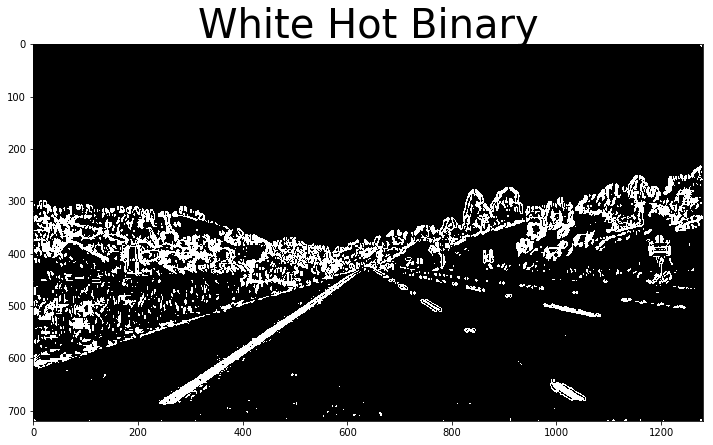

In [35]:
# Plot the result
plt.figure(10, figsize=(12,9))
plt.imshow(gray_grad)
plt.title('White Hot Binary', fontsize=40)

# plt.savefig("./test_images/white-hot-binary.png", transparent = False)